In [70]:
######################
#import useful modules
######################

import sys

sys.path.append("/home/gula/Desktop/Work_capella/Python/Python_Modules_p3/") 

from Modules import *
from Modules_gula import *

import scipy.stats as st
import functools

from matplotlib.offsetbox import AnchoredText
import matplotlib.colors as colors
########

%matplotlib inline


In [71]:
# Pick a simulation and time

time = 64
simulname = 'nesev'


#########


## Pick a section (Latmix alike)

In [72]:
#########

laty = 350
latx = 1002

ix1=latx-2000; ix2=latx+2000
iy1=laty-2000; iy2=laty+2000

###################################################################################
# Load simulation

simul =  load(simul = simulname + ' [' + format(np.max([0,iy1])) + ',' + format(iy2)\
                               +  ',' + format(np.max([0,ix1])) + ',' + format(ix2) +',[1,300,1]] ' + format(time), output=False);

# Compute surface vorticity

vrt =  tools.psi2rho( var('vrt',simul,depths=[0]).data ) / simul.f

print(simul.date)
print(simul.ncfile)


file opened in oceandate
file closed in oceandate
Jan 07 - 12:01
/data0/project/meddle//gula/ROMS/Simulations/NESEV/NESEV/nesev_his.00064.nc


In [73]:
####################################
# Load data for an example vertical section
####################################


iy = 5
ix1=latx-600; ix2=latx+700
iy1=laty-iy; iy2=laty+iy


###################################################################################

simuly = load(simul = simulname + ' [' + format(np.max([0,iy1])) + ',' + format(iy2)\
                              +  ',' + format(np.max([0,ix1])) + ',' + format(ix2)\
                              +  ',[1,300,1]] ' + format(time), output=False);

ix1,ix2=0,-1; iy1,iy2=0,-1

print(simuly.coord,simuly.date)

###################################################################################
#Compute vertical coordinates 
###################################################################################

[z_ry,z_wy] = tools.get_depths(simuly)

# define lon in 3d
lat3dy = np.tile(simuly.y.T,(z_ry.shape[2],1,1)).T
lat3dy_w = np.tile(simuly.y.T,(z_wy.shape[2],1,1)).T

#################################################

vrtzy = (var('vrt',simuly).data.T / tools.rho2psi(simuly.f).T ).T
divzy =var('div',simuly).data
wzy = var('w',simuly).data

# for plots
rhozy = var('rho1',simuly).data + simul.rho0 - 1000.
#hbly = var('hbl',simuly).data
hbls_rhoy = var('hbls_rho',simuly).data

#################################################

strzy = (var('str',simuly).data.T / simuly.f.T ).T
vrtzy_rho = tools.psi2rho(vrtzy)

#################################################

dxbuoy2zy = var('dxbuoy2',simuly).data 
tendzy  = var('tendency',simuly).data

file opened in oceandate
file closed in oceandate
[345, 355, 402, 1702, array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 16

In [74]:
#Load data from LatMix (just to get the location of the track)
############

import scipy.io as io

adcp='75'; matfile = 'Data/soup_vorticity_os75bb_fit.mat'; zbin = [50,100,150,200,255] #,300,400,600]
SM = io.loadmat(matfile)

LL = SM['LL']
lon = np.real(LL)[0,:]
lat = np.imag(LL)[0,:]

LLs = SM['LLs']
lons = np.real(LLs)[0,:]
lats = np.imag(LLs)[0,:]

print(lon.shape)

(2430,)


/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  from ipykernel import kernelapp as app


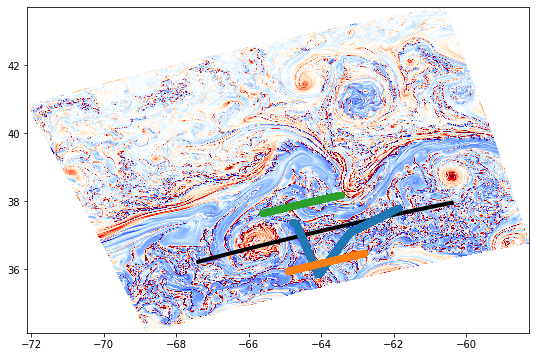

In [75]:
# Plot horizontal map of the region
###############################

my_cmap=plot.ncview_colormap('blu_red')
levels = np.arange(-1.,1.01,0.01)*2.    

###############################

fig = plt.figure(figsize=(9.0,6.0))

###############################

ax1 = plt.subplot(1,1,1);
CS1 = plt.pcolormesh(simul.x.T,simul.y.T,ma.masked_invalid(vrt.T),\
                     vmin=min(levels), vmax=max(levels),cmap=my_cmap,rasterized=True);

plt.plot(simuly.x[:,iy], simuly.y[:,iy],'-k',linewidth=4)
plt.plot(lon, lat,'-y',linewidth=4)
plt.plot(lons, lats,'-o',linewidth=4)

plt.plot(simul.x[latx-200:latx+200,laty-200], simul.y[latx-200:latx+200,laty-200],'o',linewidth=2)
plt.plot(simul.x[latx-200:latx+200,laty+200], simul.y[latx-200:latx+200,laty+200],'o',linewidth=2)

plt.savefig(simulname + '_with_Latmix_track_' + format(simul.time) + '.png',bbox_inches='tight', transparent='true', dpi=200)

    

/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  app.launch_new_instance()
/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:26: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:36: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C 

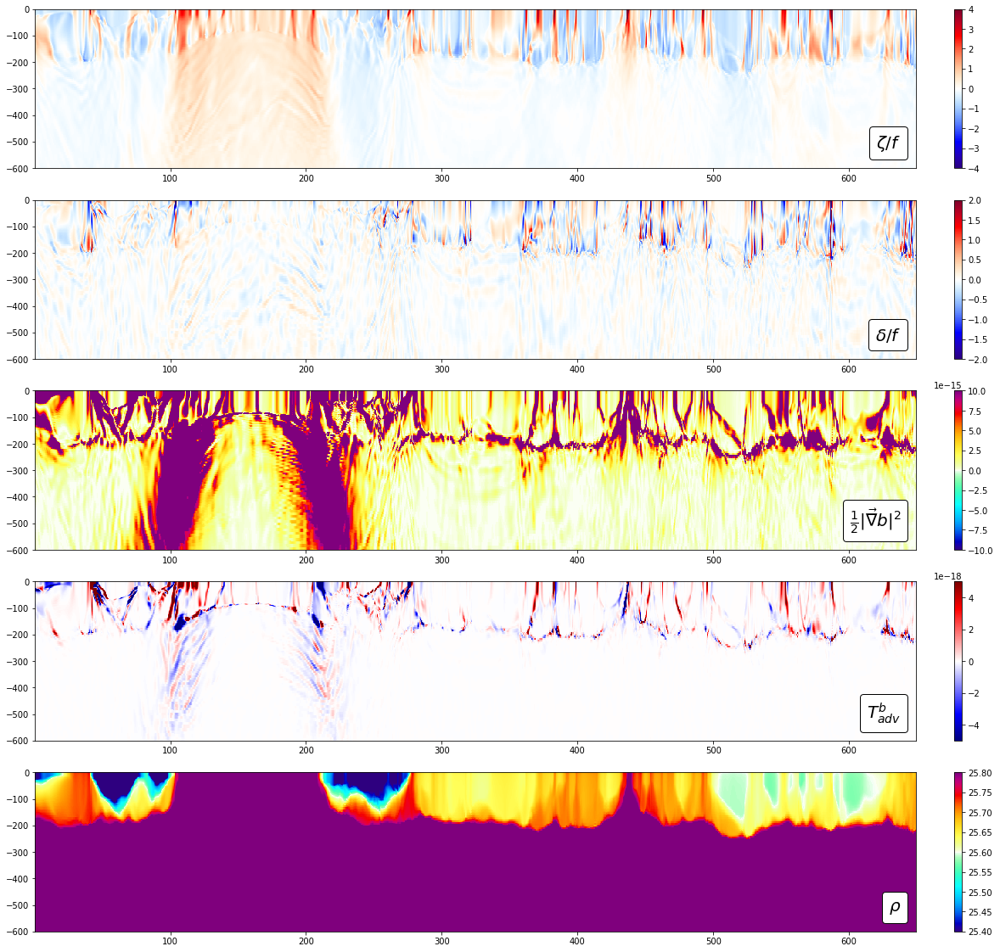

In [76]:
# Plot Vertical sections of various variables
###############################################

#x = lat3dy[ix,iy1:iy2,:]
x= np.tile(np.cumsum(1./simuly.pn,axis=0)[:,iy],(lat3dy.shape[-1],1)).T/1000.
z = -z_ry[:,iy,:]

#########


f,axes = plt.subplots(5,1,figsize=(20,20)) #,facecolor='Gainsboro') #, constrained_layout=True)

#########

CS0 = axes[0].pcolormesh(x,-z,vrtzy_rho[:,iy,:],vmin=-4,vmax=4,\
                   cmap =plot.ncview_colormap('blu_red') ); 
f.colorbar(CS0, ax = axes[0],fraction=0.03, pad=0.04)
axes[0].set_ylim([-600,0])

at = AnchoredText(r'$\zeta/f$',loc=4, prop=dict(size=20), frameon=True, )
at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2"); axes[0].add_artist(at)

#########

CS1 = axes[1].pcolormesh(x,-z,divzy[:,iy,:],vmin=-2,vmax=2,\
                   cmap =plot.ncview_colormap('blu_red') ); 
f.colorbar(CS1, ax = axes[1],fraction=0.03, pad=0.04)
axes[1].set_ylim([-600,0])

at = AnchoredText(r'$\delta/f$',loc=4, prop=dict(size=20), frameon=True, )
at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2"); axes[1].add_artist(at)

#########

CS2 = axes[2].pcolormesh(x,-z,dxbuoy2zy[:,iy,:],vmin=-1e-14,vmax=1e-14,\
                   cmap =plot.ncview_colormap('jaisnd') ); 
f.colorbar(CS2, ax = axes[2],fraction=0.03, pad=0.04)
axes[2].set_ylim([-600,0])

at = AnchoredText(r'$\frac{1}{2} \| \vec{\nabla} b \|^2 $',loc=4, prop=dict(size=20), frameon=True, )
at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2"); axes[2].add_artist(at)

#########

CS3 = axes[3].pcolormesh(x,-z,tendzy[:,iy,:],\
                   cmap =plot.ncview_colormap('blue_red'),\
                          vmin=-5e-18,vmax=5e-18 ); 
f.colorbar(CS3, ax = axes[3],fraction=0.03, pad=0.04)
axes[3].set_ylim([-600,0])

at = AnchoredText(r'$T^b_{adv}$',loc=4, prop=dict(size=20), frameon=True, )
at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2"); axes[3].add_artist(at)

#########

CS4 = axes[4].pcolormesh(x,-z,rhozy[:,iy,:],\
                   cmap =plot.ncview_colormap('jaisnd'),\
                         vmin=25.9-0.5,vmax=26.3-0.5 ); 
f.colorbar(CS4, ax = axes[4],fraction=0.03, pad=0.04)
axes[4].set_ylim([-600,0])

at = AnchoredText(r'$\rho$',loc=4, prop=dict(size=20), frameon=True, )
at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2"); axes[4].add_artist(at)


plt.savefig('section_' + simulname + '_' + format(time)  +  '.png',bbox_inches='tight', transparent='true', dpi=200)



## Check vrt - strain statistics

In [77]:
# Load a domain to compute stastics
###############################################


#ix1=latx-200+100; ix2=latx+200+100
#iy1=laty-200+100; iy2=laty+200+100

ix1=latx-100; ix2=latx+100
iy1=laty-100; iy2=laty+100


#############################################

simul =  load(simul = simulname + ' [' + format(np.max([0,iy1])) + ',' + format(iy2)\
                               +  ',' + format(ix1) + ',' + format(ix2) +',[1,300,1]] ' + format(time), output=False);

#vrt = var('vrt',simul,depths=[0]).data/ tools.rho2psi(simul.f)
#############################################

simul.x = np.cumsum(1/simul.pm,axis=0)/1000.
simul.y = np.cumsum(1/simul.pn,axis=1)/1000.
simul.x -=  simul.x[0,0]
simul.y -=  simul.y[0,0]

#############################################

depths = [-200,-150,-100, -50,-10]
label_depths = ['z=' +format(depth)+' m' for depth in depths]


file opened in oceandate
file closed in oceandate


In [78]:
# Compute variables over the domain at different depths
###############################################

print('vrt')
vrt = tools.nanbnd( (tools.psi2rho(var('vrt',simul,depths=depths).data).T/simul.f.T ).T ,1)
print('strain')
strain = tools.nanbnd(( var('str',simul,depths=depths).data.T / simul.f.T ).T ,1)
print('w')
w = tools.nanbnd(var('w',simul,depths=depths).data,1)
print('div')
div = tools.nanbnd(var('div',simul,depths=depths).data,1)


###############################
print('dxbuoy2')
dxbuoy2 = var('dxbuoy2',simul,depths=depths).data 

print('tendency')
tendency  = var('tendency',simul,depths=depths).data

###############################


vrt
strain
w
div
corgrid [0, 0]
nchunk 1
in get_var depths is [-200, -150, -100, -50, -10]
dxbuoy2
tendency


/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:22: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:27: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:32: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Ei

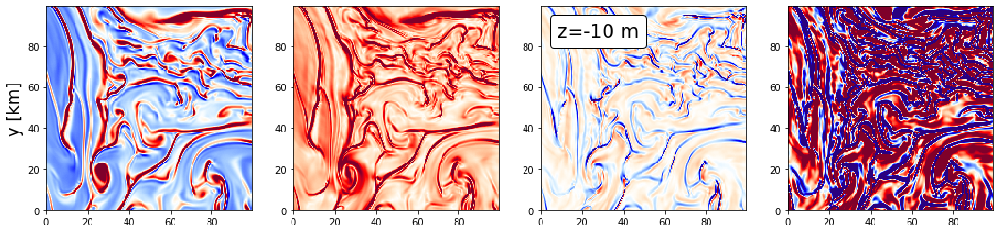

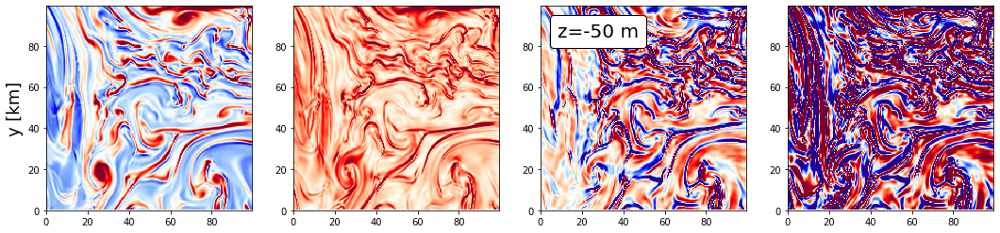

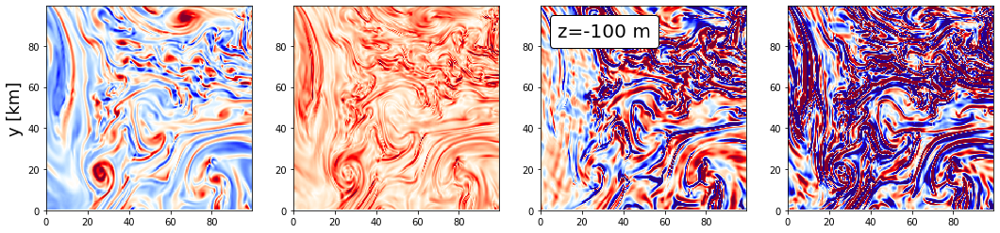

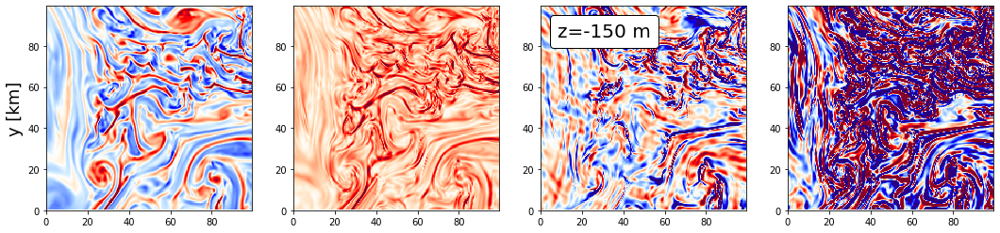

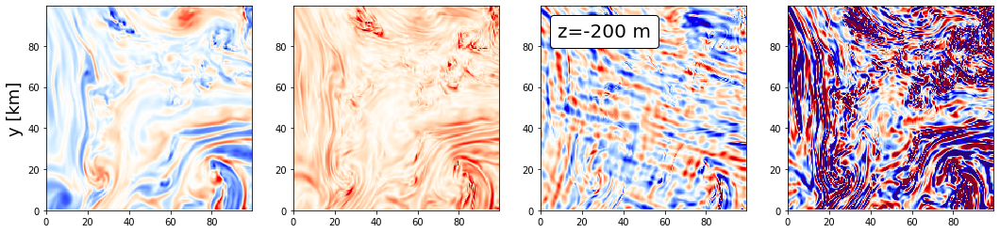

In [79]:
# Plot variables over the domain at different depths
###############################################


##################################################

my_cmap=plot.ncview_colormap('blu_red')
levels = np.arange(-1.,1.01,0.01)*2.    
levelsw = np.arange(-1.,1.01,0.01)*0.2e-2   


###############################

for idepth in range(len(depths))[::-1]:
    
    
    fig = plt.figure(figsize=(18.0,4.0))

    ###############################

    ax1 = plt.subplot(1,4,1);
    CS1 = plt.pcolormesh(simul.x.T,simul.y.T,ma.masked_invalid(vrt[:,:,idepth].T),vmin=min(levels), vmax=max(levels),cmap=my_cmap,rasterized=True);
    plt.ylabel(r'y [km]',fontsize=18) #plt.xlabel(r'${\rm km}$');

    ###############################
    ax1 = plt.subplot(1,4,2);
    CS1 = plt.pcolormesh(simul.x.T,simul.y.T,ma.masked_invalid(strain[:,:,idepth].T),vmin=min(levels), vmax=max(levels),cmap=my_cmap,rasterized=True);
    #plt.ylabel(r'y [km]',fontsize=18) #plt.xlabel(r'${\rm km}$');

    ###############################
    ax1 = plt.subplot(1,4,3);
    CS1 = plt.pcolormesh(simul.x.T,simul.y.T,ma.masked_invalid(w[:,:,idepth].T),vmin=min(levelsw), vmax=max(levelsw),cmap=my_cmap,rasterized=True);
    #plt.ylabel(r'y [km]',fontsize=18) #plt.xlabel(r'${\rm km}$');

    # add label
    at = AnchoredText(label_depths[idepth],loc=2, prop=dict(size=20), frameon=True, )
    at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2"); ax1.add_artist(at)

    ###############################
    ax1 = plt.subplot(1,4,4);
    CS1 = plt.pcolormesh(simul.x.T,simul.y.T,ma.masked_invalid(div[:,:,idepth].T),vmin=min(levels*0.1), vmax=max(levels*0.1),cmap=my_cmap,rasterized=True);
    #plt.ylabel(r'y [km]',fontsize=18) #plt.xlabel(r'${\rm km}$');
    

In [80]:
# Functions to plot JPDF
########################

import scipy.stats as st


def jpdf(vrt,strain,w,label,vrtsfc=None,strainsfc=None,varname='w',cond=True,\
         cmap = 'blu_red', levels=np.linspace(-1e-2,1e-2,100)):
    
    
    ###################

    my_cmap=plot.ncview_colormap(cmap); 
    
    if varname=='div':
        varlabel = 'Divergence [10$^{-2}$]'
    elif varname=='dxbuoy2':
        varlabel=r'$\frac{1}{2} \| \vec{\nabla} b \|^2 $'    
    elif varname=='tendency':
        varlabel = '$T^b_{adv}$' 
    else:
        varlabel = 'Vertical velocity' 
    
    ###################
    
    if vrtsfc is None: vrtsfc=vrt
    if strainsfc is None: strsfc=strain

    xlim_ref = 6; bins_ = np.linspace(-xlim_ref,xlim_ref,150)
    sample_points_identity = np.arange(0,10,0.1)

    ##########
    f,axes = plt.subplots(1,3,figsize=(20,6)) #,facecolor='Gainsboro') #, constrained_layout=True)

    for axe in axes:
        axe.plot(sample_points_identity, sample_points_identity, '--', c = 'gray', alpha = 0.8)
        axe.plot(-sample_points_identity, sample_points_identity, '--', c = 'gray', alpha = 0.8)
        axe.set_xlim((-0.6*xlim_ref,1.*xlim_ref)) ; axe.set_ylim((0,1.*xlim_ref)) ; axe.set_aspect('equal')
        axe.set_xlabel(r'$\zeta/f$',fontsize=16); axe.set_ylabel(r'$\sigma/|f|$',fontsize=16)

        
    ####################
    ## Density of particles
    d_vrt_strain, xedges, yedges,_ = st.binned_statistic_2d(vrt[cond].ravel(),strain[cond].ravel(),\
                                                            values=None,statistic='count', bins = bins_)
    
    # Plot 2D histogram using pcolormesh
    im = axes[0].pcolormesh(xedges,yedges,ma.masked_invalid(d_vrt_strain.T),\
                            cmap='Blues',norm=colors.SymLogNorm(linthresh=0.01,base=10,vmin=0,vmax=1000))
    f.colorbar(im, ax = axes[0],fraction=0.03, pad=0.04)
    axes[0].set_title('# of grid points',fontsize=18)
    
    
    ####################
    ## vertical velocity
    w_vrt_strain, xedges, yedges,_ = st.binned_statistic_2d(vrt[cond].ravel(),strain[cond].ravel(),values=w[cond].ravel(),\
                                                        statistic='mean', bins = bins_)
    w_vrt_strain[d_vrt_strain<1] = np.nan # Replace values where the JPDF is really low (i.e. ery unlikely points) by nan
    # so that they do not pollute the figure !

    # Plot 2D histogram using pcolormesh
    im = axes[1].pcolormesh(xedges,yedges,ma.masked_invalid(w_vrt_strain.T),cmap=my_cmap,\
                            norm=colors.SymLogNorm(linthresh=levels.max()/100,base=10,vmin=levels.min(),vmax=levels.max()))
    f.colorbar(im, ax = axes[1],fraction=0.03, pad=0.04)

        
    axes[1].set_title(varlabel,fontsize=18)
    
    ####################
    ## vertical velocity 
    w_vrt_strain, xedges, yedges,_ = st.binned_statistic_2d(vrtsfc[cond].ravel(),strainsfc[cond].ravel(),values=w[cond].ravel(),\
                                                        statistic='mean', bins = bins_)
    #w_vrt_strain[d_vrt_strain<1] = np.nan # Replace values where the JPDF is really low (i.e. ery unlikely points) by nan
    # so that they do not pollute the figure !
    
    axes[2].set_xlabel(r'$\zeta/f$ (surface)',fontsize=16); axes[2].set_ylabel(r'$\sigma/|f|$ (surface)',fontsize=16)

    # Plot 2D histogram using pcolormesh
    im = axes[2].pcolormesh(xedges,yedges,ma.masked_invalid(w_vrt_strain.T),cmap=my_cmap,\
                            norm=colors.SymLogNorm(linthresh=levels.max()/100,base=10,vmin=levels.min(),vmax=levels.max()))
    f.colorbar(im, ax = axes[2],fraction=0.03, pad=0.04)
    

        
    axes[2].set_title(varlabel,fontsize=18)
    
    # add label
    at = AnchoredText(label,loc=2, prop=dict(size=20), frameon=True, )
    at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2"); axes[1].add_artist(at)
    
    plt.subplots_adjust(wspace=0.3)
    
    
    filename = simulname + '_' + format(time) + '_' +  varname + '_z' + label.replace(" ", "") 
        
    plt.savefig(filename + '.png' ,bbox_inches='tight', transparent='true', dpi=200)

    
###############################

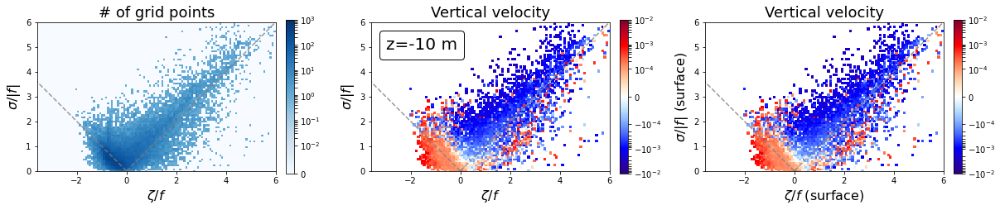

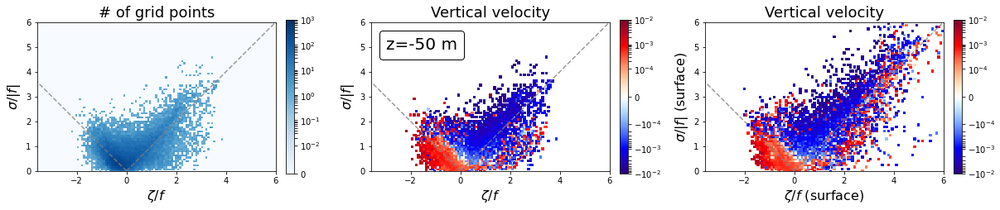

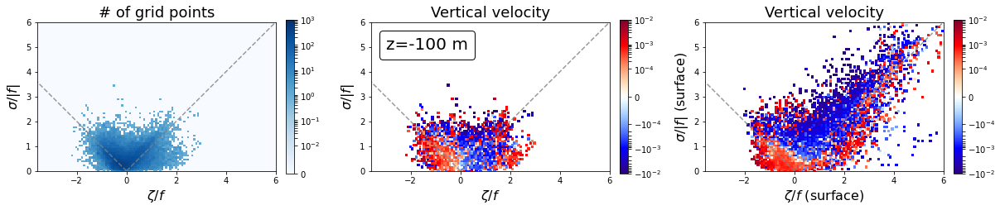

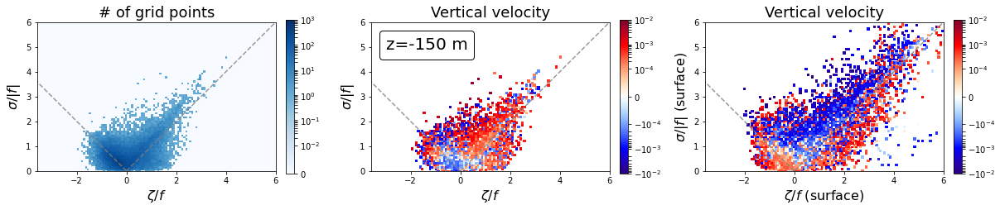

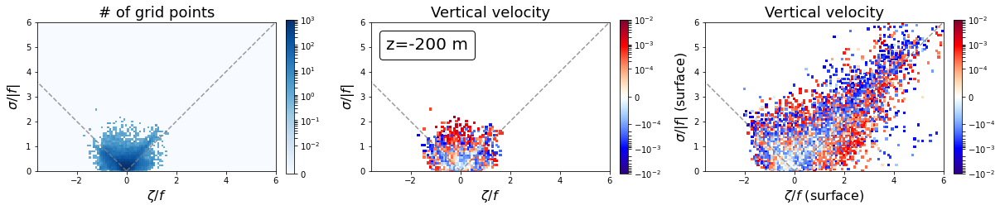

In [81]:
# JPDF for vertical velocity at different depths
################################################

for idepth in range(len(depths))[::-1][:]:

    jpdf(vrt[:,:,idepth], strain[:,:,idepth], w[:,:,idepth],\
         label_depths[idepth],vrtsfc=vrt[:,:,-1],strainsfc=strain[:,:,-1])
    
    

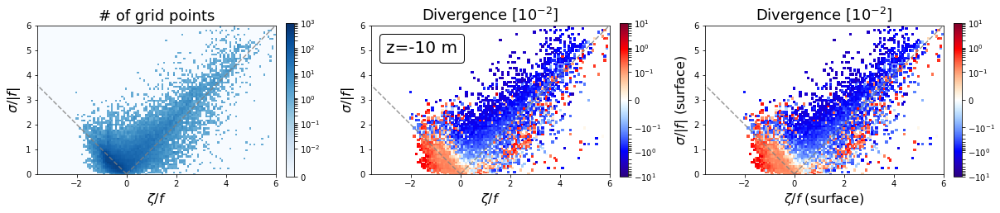

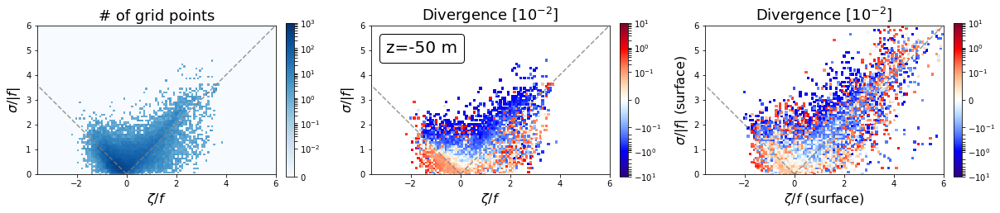

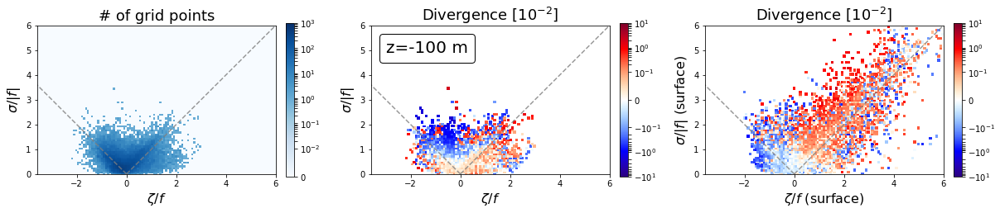

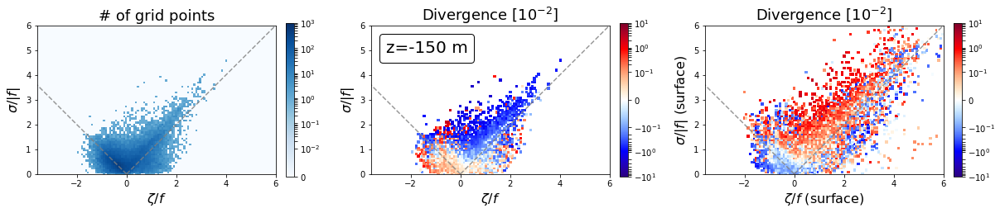

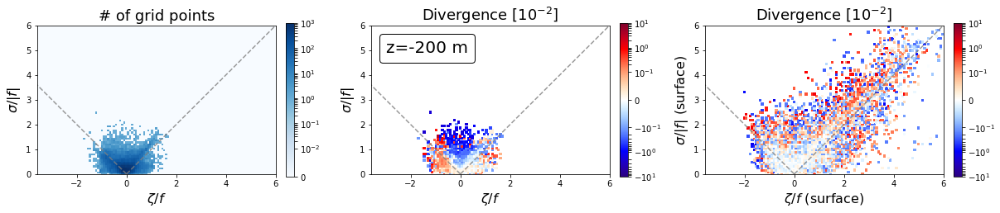

In [82]:
# JPDF for divergence at different depths
##########################################



for idepth in range(len(depths))[::-1][:]:

    jpdf(vrt[:,:,idepth],strain[:,:,idepth],div[:,:,idepth],label_depths[idepth],\
         vrtsfc=vrt[:,:,-1],strainsfc=strain[:,:,-1], levels=np.arange(-1.,1.02,0.02)*10.,varname='div')
    
    

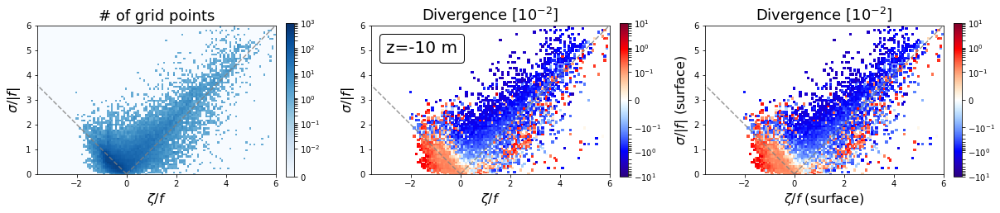

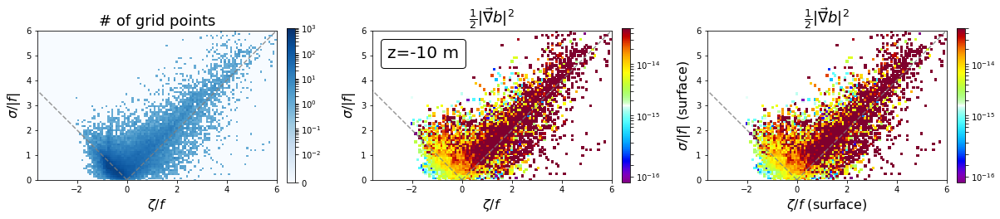

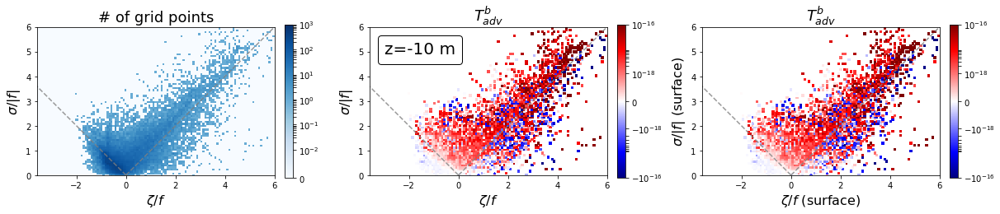

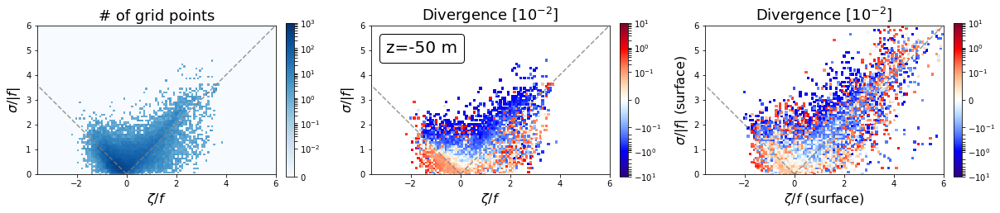

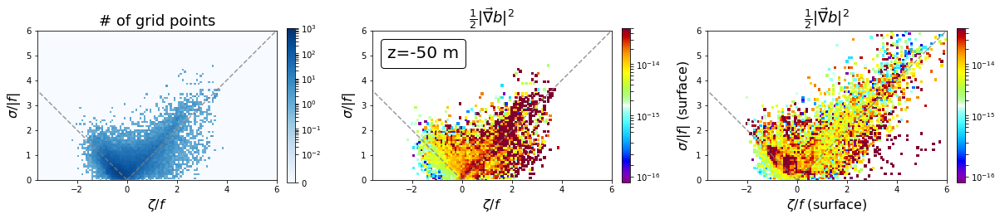

...

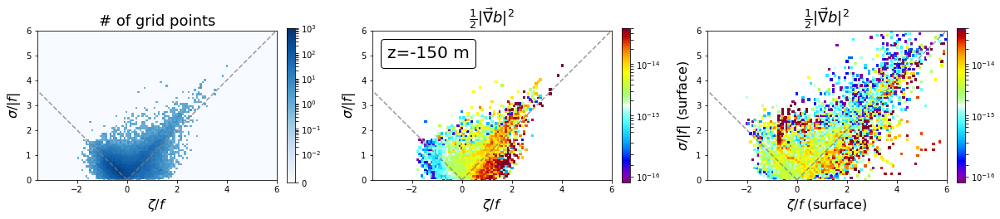

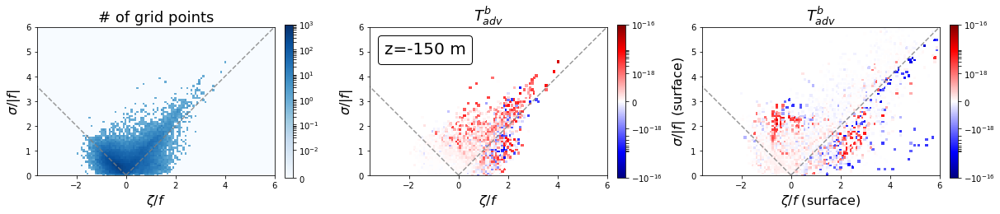

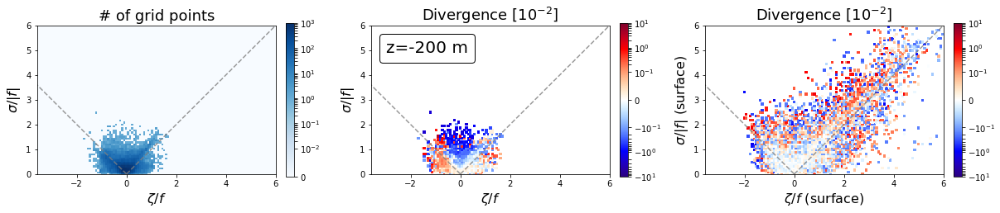

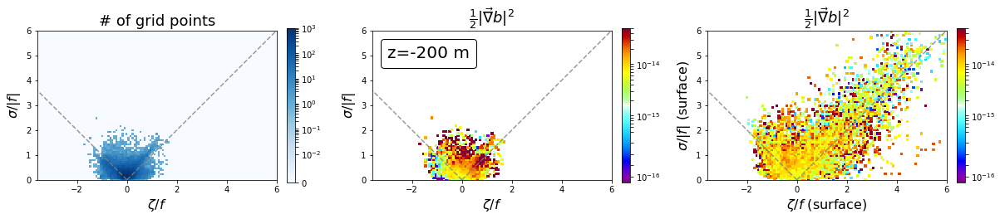

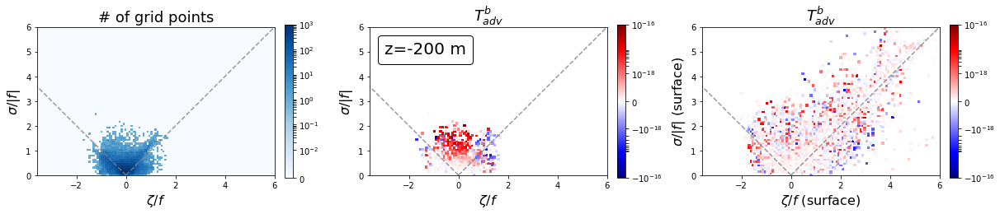

In [83]:
# JPDF for frontal quantities at different depths
##########################################


for idepth in range(len(depths))[::-1][:]:

    jpdf(vrt[:,:,idepth],strain[:,:,idepth],div[:,:,idepth],label_depths[idepth],\
         vrtsfc=vrt[:,:,-1],strainsfc=strain[:,:,-1], levels=np.arange(-1.,1.02,0.02)*10.,varname='div')
    
    jpdf(vrt[:,:,idepth],strain[:,:,idepth],dxbuoy2[:,:,idepth],label_depths[idepth],\
         vrtsfc=vrt[:,:,-1],strainsfc=strain[:,:,-1],varname='dxbuoy2', \
         cmap = 'jaisnb', levels=np.arange(0.001,1.02,0.005)*5e-14,)
    
    jpdf(vrt[:,:,idepth],strain[:,:,idepth],tendency[:,:,idepth],label_depths[idepth],\
         vrtsfc=vrt[:,:,-1],strainsfc=strain[:,:,-1],varname='tendency', \
         cmap = 'blue_red', levels=np.arange(-1.,1.02,0.02)*1e-16) 
    
    


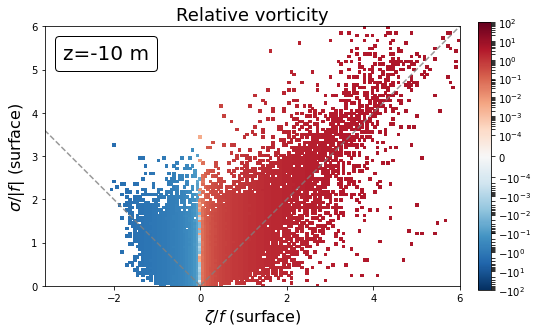

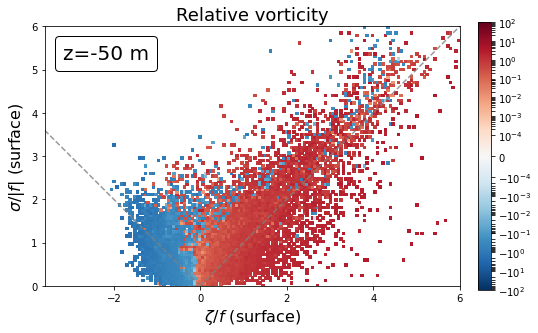

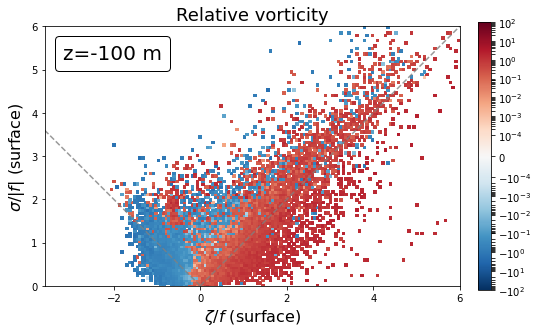

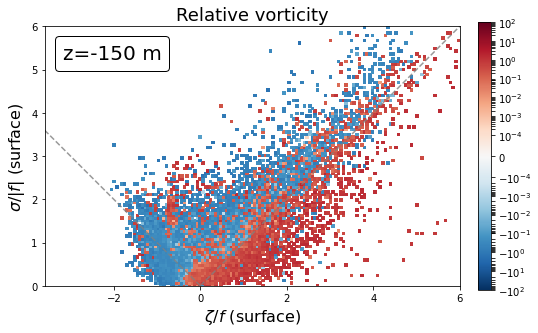

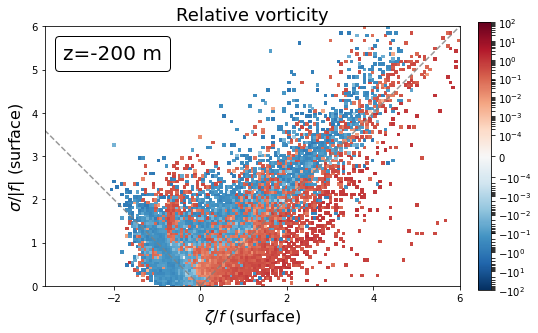

In [84]:
# JPDF for vrt at depth versus surface vrt
##########################################


def jpdf_vrt(vrtsfc,strainsfc,vrt,label):
    
    
    xlim_ref = 6; bins_ = np.linspace(-xlim_ref,xlim_ref,200)
    sample_points_identity = np.arange(0,10,0.1)

    ##########
    f,axe = plt.subplots(1,1,figsize=(8,6)) #,facecolor='Gainsboro') #, constrained_layout=True)

    axe.plot(sample_points_identity, sample_points_identity, '--', c = 'gray', alpha = 0.8)
    axe.plot(-sample_points_identity, sample_points_identity, '--', c = 'gray', alpha = 0.8)
    axe.set_xlim((-0.6*xlim_ref,1.*xlim_ref)) ; axe.set_ylim((0,1.*xlim_ref)) ; axe.set_aspect('equal')
    axe.set_xlabel(r'$\zeta/f$',fontsize=16); axe.set_ylabel(r'$\sigma/|f|$',fontsize=16)

    ####################
    ## vertical velocity
    vrt_vrt_strain, xedges, yedges,_ = st.binned_statistic_2d(vrtsfc.ravel(),strainsfc.ravel(),values=vrt.ravel(),\
                                                        statistic='mean', bins = bins_)


    # Plot 2D histogram using pcolormesh
    im = axe.pcolormesh(xedges,yedges,ma.masked_invalid(vrt_vrt_strain.T),cmap='RdBu_r',\
                        norm=colors.SymLogNorm(linthresh=1e-4,base=10,vmin=-100,vmax=100))
    f.colorbar(im, ax = axe,fraction=0.03, pad=0.04)
    axe.set_title('Relative vorticity',fontsize=18)
    axe.set_xlabel(r'$\zeta/f$ (surface)',fontsize=16); axe.set_ylabel(r'$\sigma/|f|$ (surface)',fontsize=16)

    # add label
    at = AnchoredText(label,loc=2, prop=dict(size=20), frameon=True, )
    at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2"); axe.add_artist(at)
    
    plt.subplots_adjust(wspace=0.3)
    
    
###############################



for idepth in range(len(depths))[::-1]:

    jpdf_vrt(vrt[:,:,-1],strain[:,:,-1],vrt[:,:,idepth],label_depths[idepth])
    
    
    
    

/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:82: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:87: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.


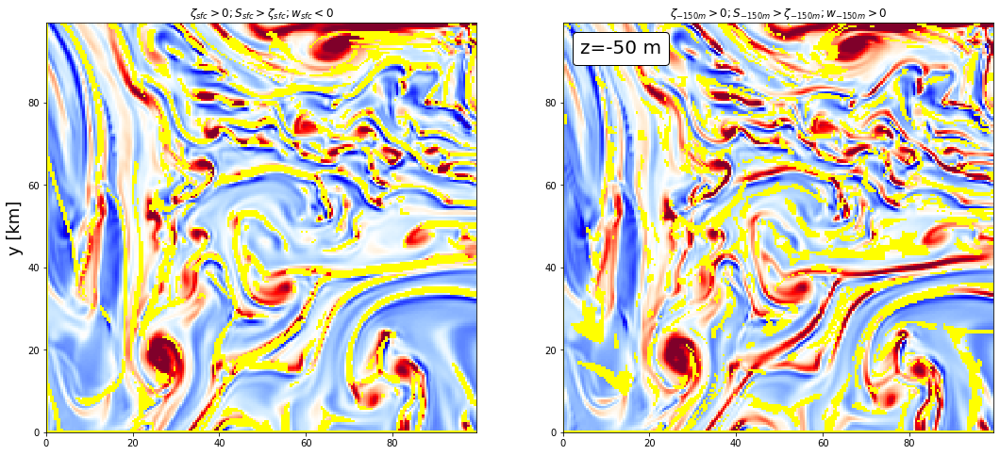

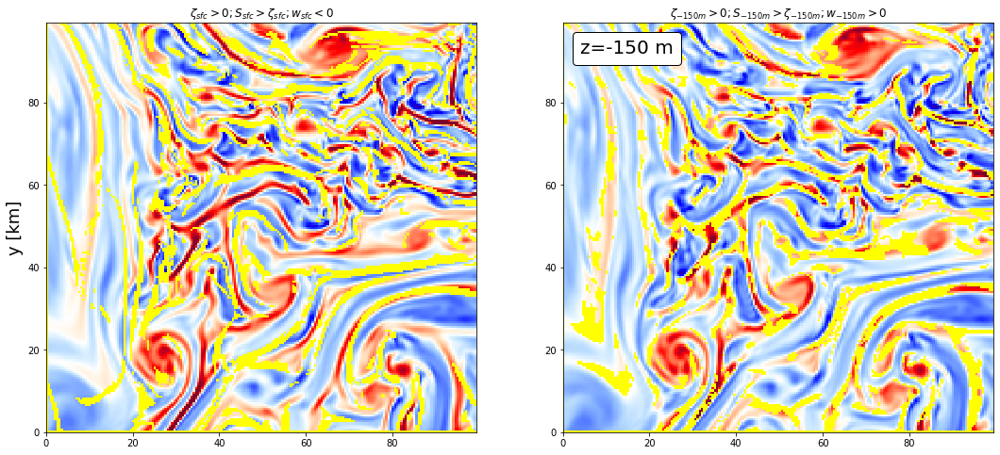

In [85]:
# Use conditions to select different areas of the JPDF
#######################################################




vrtc1 = copy(vrt)
strainc1 = copy(strain)
wc1 = copy(w)
divc1 = copy(div)

vrtc2 = copy(vrt)
strainc2 = copy(strain)
wc2 = copy(w)
divc2 = copy(div)


##################################################

idepth0 = np.nanargmin(np.abs(np.array(depths)+150))


##################################################

'''
cond1 = functools.reduce(np.logical_and, (hbls_rho>150,hbls_rho<200,\
                                         vrt[:,:,idepth0]>0,\
                                         strain[:,:,idepth0]>vrt[:,:,idepth0],\
                                         w[:,:,idepth0]>0.,\
                                         w[:,:,-2]<0.))

cond2 = functools.reduce(np.logical_and, (hbls_rho>150,hbls_rho<200,\
                                         vrt[:,:,idepth0]>0,\
                                         strain[:,:,idepth0]>vrt[:,:,idepth0],\
                                         w[:,:,idepth0]>0.,\
                                         w[:,:,-2]>0.))
'''

#cond = functools.reduce(np.logical_and, (vrt[:,:,idepth0]>0,strain[:,:,idepth0]>vrt[:,:,idepth0],w[:,:,idepth0]<0.))

# surface fronts
title_cond1 = r'$\zeta_{sfc}>0; S_{sfc}>\zeta_{sfc}; w_{sfc}<0$'
cond1 = functools.reduce(np.logical_and, (vrt[:,:,-1]>0,strain[:,:,-1]>vrt[:,:,-1],w[:,:,-1]<0.));

# surface fronts
title_cond2 = r'$\zeta_{-150 m}>0; S_{-150 m}>\zeta_{-150 m}; w_{-150 m}>0$'
cond2 = functools.reduce(np.logical_and, (\
                                         vrt[:,:,idepth0]>0,\
                                         strain[:,:,idepth0]>vrt[:,:,idepth0],\
                                         w[:,:,idepth0]>0.))
####

vrtc1[cond1] = np.nan
strainc1[cond1] = np.nan
wc1[cond1] = np.nan
divc1[cond1] = np.nan

vrtc2[cond2] = np.nan
strainc2[cond2] = np.nan
wc2[cond2] = np.nan
divc2[cond2] = np.nan

##################################################

my_cmap=plot.ncview_colormap('blu_red')
levels = np.arange(-1.,1.01,0.01)*2.    
levelsw = np.arange(-1.,1.01,0.01)*0.2e-2   

my_cmap.set_bad('yellow',1.)

###############################

for idepth in [3,1]:
    
    
    fig = plt.figure(figsize=(18.0,8.0))
    
    
    ###############################

    ax1 = plt.subplot(1,2,1); plt.title(title_cond1)
    CS1 = plt.pcolormesh(simul.x.T,simul.y.T,ma.masked_invalid(vrtc1[:,:,idepth].T),vmin=min(levels), vmax=max(levels),cmap=my_cmap,rasterized=True);
    plt.ylabel(r'y [km]',fontsize=18) #plt.xlabel(r'${\rm km}$');

    ###############################
    ax1 = plt.subplot(1,2,2); plt.title(title_cond2)
    CS1 = plt.pcolormesh(simul.x.T,simul.y.T,ma.masked_invalid(vrtc2[:,:,idepth].T),vmin=min(levels), vmax=max(levels),cmap=my_cmap,rasterized=True);
    #plt.ylabel(r'y [km]',fontsize=18) #plt.xlabel(r'${\rm km}$');

    # add label
    at = AnchoredText(label_depths[idepth],loc=2, prop=dict(size=20), frameon=True, )
    at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2"); ax1.add_artist(at)



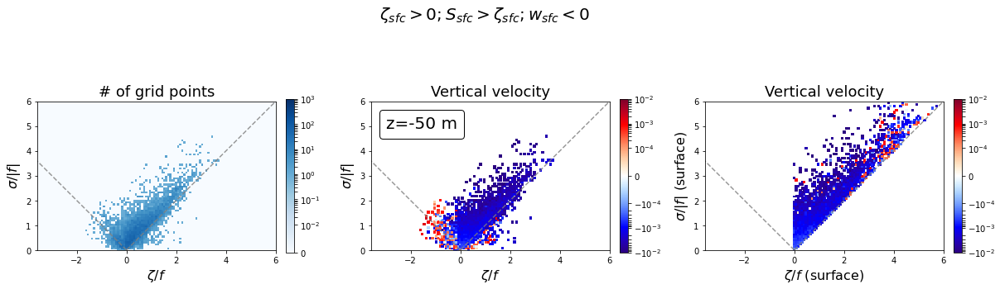

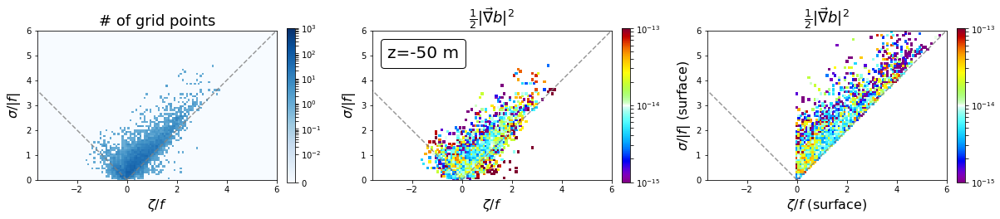

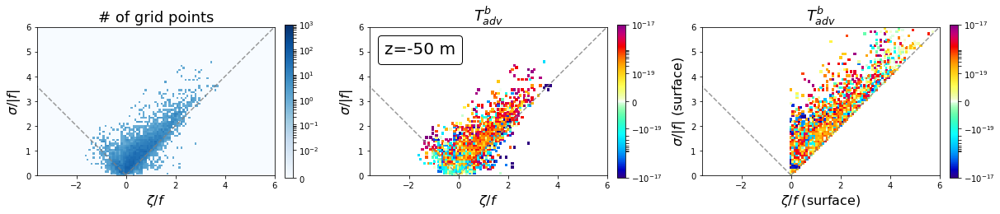

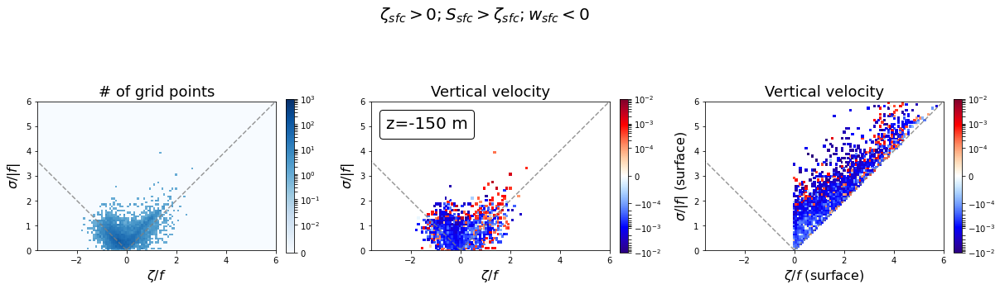

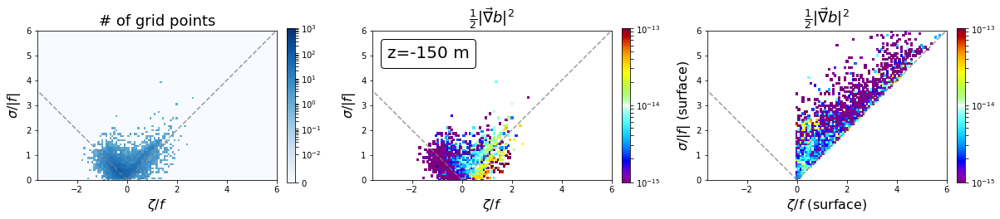

...

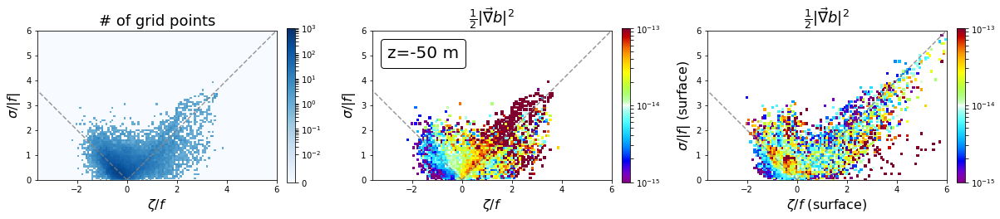

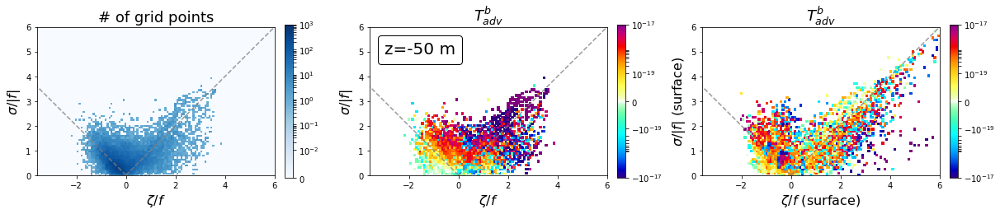

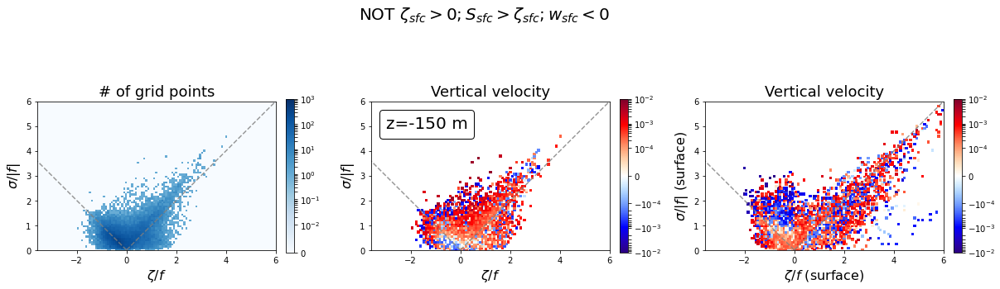

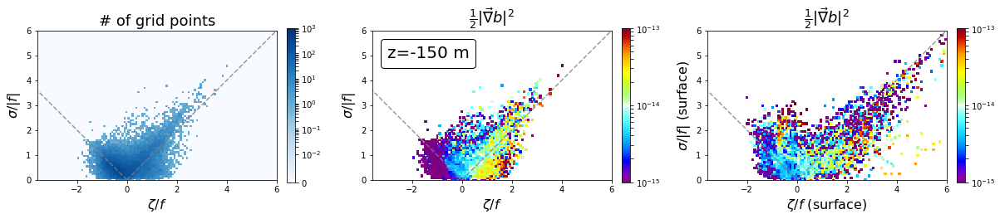

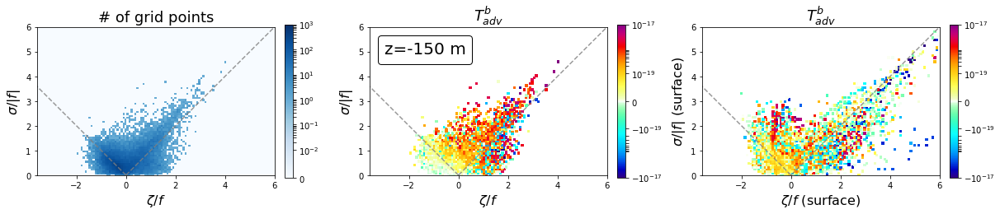

In [86]:


for idepth in [3,idepth0]:

    jpdf(vrt[:,:,idepth],strain[:,:,idepth],w[:,:,idepth],label_depths[idepth],\
         vrtsfc=vrt[:,:,-1],strainsfc=strain[:,:,-1],cond=cond1) #cond=np.logical_not(cond))
    plt.suptitle(title_cond1,fontsize=20)
    jpdf(vrt[:,:,idepth],strain[:,:,idepth],dxbuoy2[:,:,idepth],label_depths[idepth],\
         vrtsfc=vrt[:,:,-1],strainsfc=strain[:,:,-1],cond=cond1,\
         varname='dxbuoy2', cmap = 'jaisnb', levels=np.arange(0.01,1.02,0.02)*1e-13)
    jpdf(vrt[:,:,idepth],strain[:,:,idepth],tendency[:,:,idepth],label_depths[idepth],\
         vrtsfc=vrt[:,:,-1],strainsfc=strain[:,:,-1],cond=cond1,\
         varname='tendency', cmap = 'jaisnd', levels=np.arange(-1.,1.02,0.02)*1e-17) 


for idepth in [3,idepth0]:
    
    jpdf(vrt[:,:,idepth],strain[:,:,idepth],w[:,:,idepth],label_depths[idepth],\
         vrtsfc=vrt[:,:,-1],strainsfc=strain[:,:,-1],cond=np.logical_not(cond1)) #cond=np.logical_not(cond))
    plt.suptitle('NOT ' + title_cond1,fontsize=20)
    jpdf(vrt[:,:,idepth],strain[:,:,idepth],dxbuoy2[:,:,idepth],label_depths[idepth],\
         vrtsfc=vrt[:,:,-1],strainsfc=strain[:,:,-1],cond=np.logical_not(cond1),\
         varname='dxbuoy2', cmap = 'jaisnb', levels=np.arange(0.01,1.02,0.02)*1e-13)
    jpdf(vrt[:,:,idepth],strain[:,:,idepth],tendency[:,:,idepth],label_depths[idepth],\
         vrtsfc=vrt[:,:,-1],strainsfc=strain[:,:,-1],cond=np.logical_not(cond1),\
         varname='tendency', cmap = 'jaisnd', levels=np.arange(-1.,1.02,0.02)*1e-17) 
    

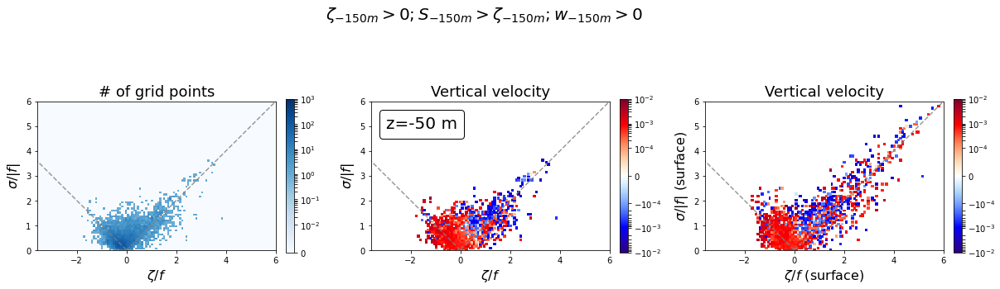

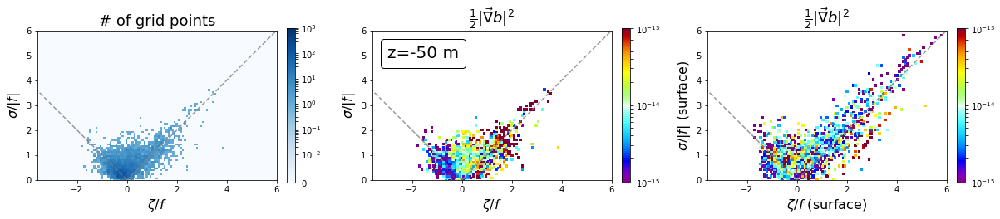

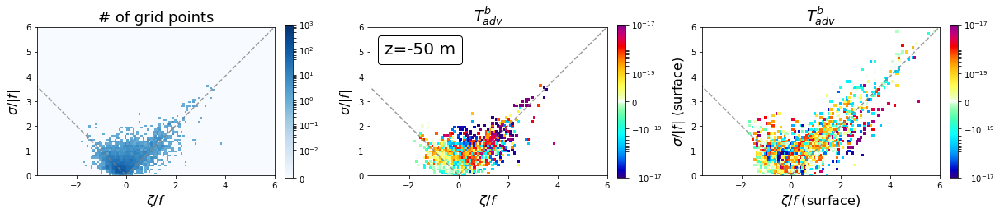

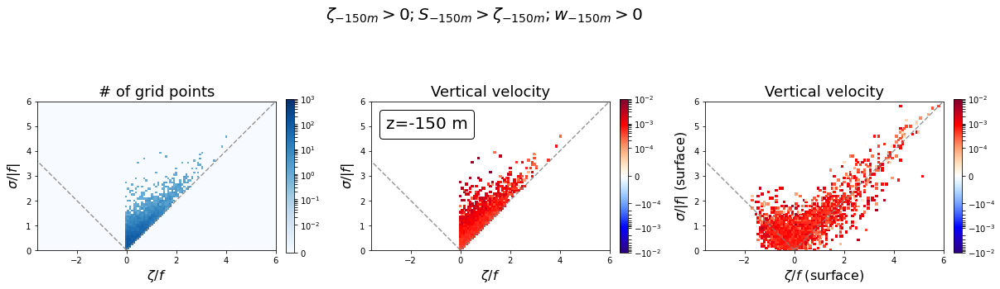

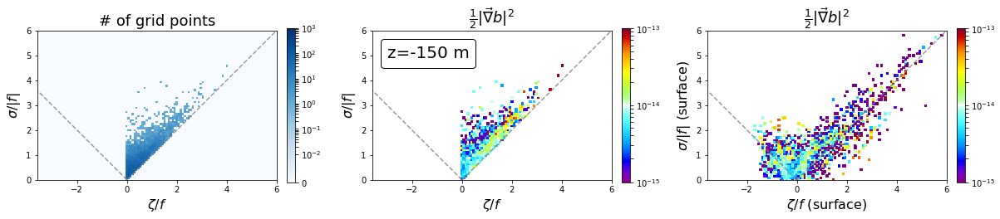

...

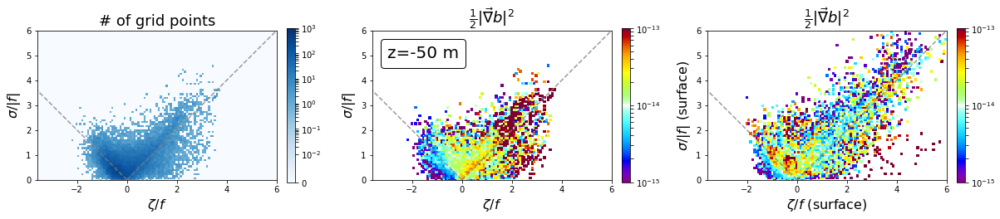

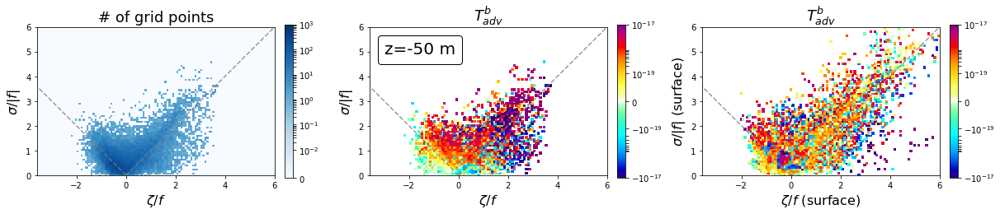

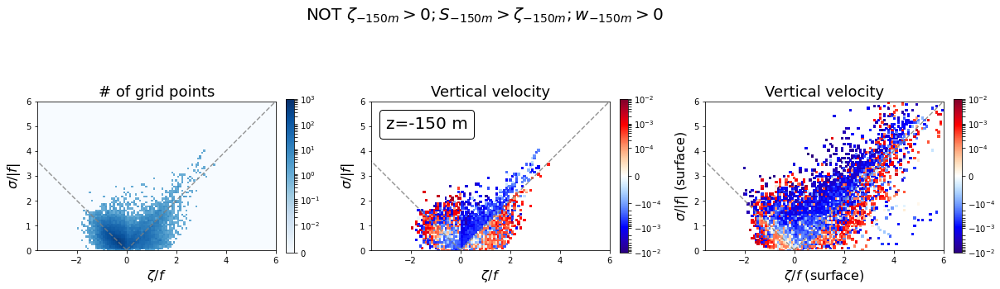

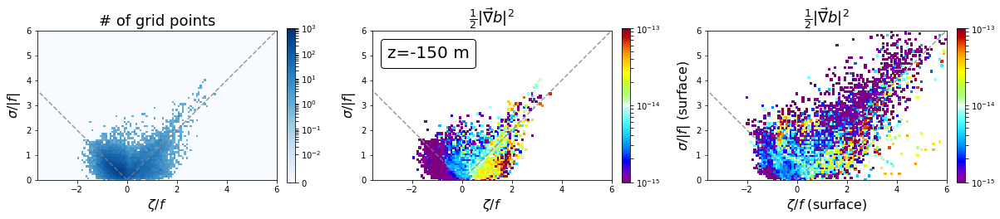

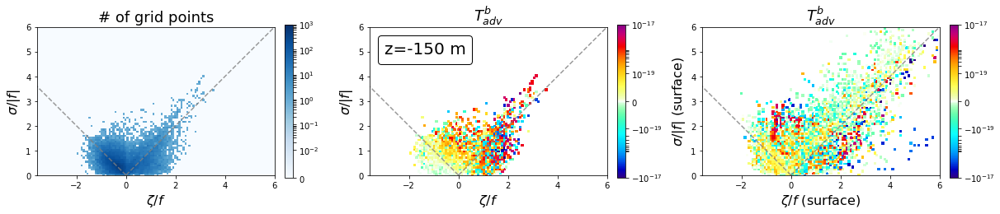

In [87]:


for idepth in [3,idepth0]:

    jpdf(vrt[:,:,idepth],strain[:,:,idepth],w[:,:,idepth],label_depths[idepth],\
         vrtsfc=vrt[:,:,-1],strainsfc=strain[:,:,-1],cond=cond2) #cond=np.logical_not(cond))
    plt.suptitle(title_cond2,fontsize=20)
    jpdf(vrt[:,:,idepth],strain[:,:,idepth],dxbuoy2[:,:,idepth],label_depths[idepth],\
         vrtsfc=vrt[:,:,-1],strainsfc=strain[:,:,-1],cond=cond2,\
         varname='dxbuoy2', cmap = 'jaisnb', levels=np.arange(0.01,1.02,0.02)*1e-13)
    jpdf(vrt[:,:,idepth],strain[:,:,idepth],tendency[:,:,idepth],label_depths[idepth],\
         vrtsfc=vrt[:,:,-1],strainsfc=strain[:,:,-1],cond=cond2,\
         varname='tendency', cmap = 'jaisnd', levels=np.arange(-1.,1.02,0.02)*1e-17) 


for idepth in [3,idepth0]:
    
    jpdf(vrt[:,:,idepth],strain[:,:,idepth],w[:,:,idepth],label_depths[idepth],\
         vrtsfc=vrt[:,:,-1],strainsfc=strain[:,:,-1],cond=np.logical_not(cond2)) #cond=np.logical_not(cond))
    plt.suptitle('NOT ' + title_cond2,fontsize=20)
    jpdf(vrt[:,:,idepth],strain[:,:,idepth],dxbuoy2[:,:,idepth],label_depths[idepth],\
         vrtsfc=vrt[:,:,-1],strainsfc=strain[:,:,-1],cond=np.logical_not(cond2),\
         varname='dxbuoy2', cmap = 'jaisnb', levels=np.arange(0.01,1.02,0.02)*1e-13)
    jpdf(vrt[:,:,idepth],strain[:,:,idepth],tendency[:,:,idepth],label_depths[idepth],\
         vrtsfc=vrt[:,:,-1],strainsfc=strain[:,:,-1],cond=np.logical_not(cond2),\
         varname='tendency', cmap = 'jaisnd', levels=np.arange(-1.,1.02,0.02)*1e-17) 
    
    

## Interpolation at HBL depth

/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:13: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  del sys.path[0]
/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:17: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.


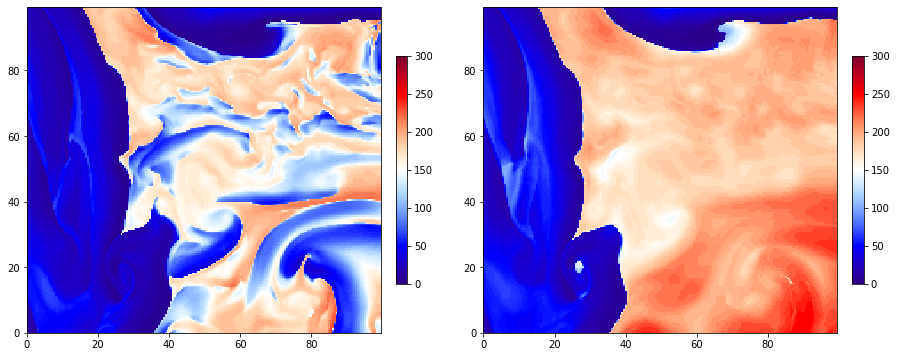

In [88]:
####

hbl = var('hbl',simul).data
hbls_rho = var('hbls_rho',simul).data

####

my_cmap=plot.ncview_colormap('blu_red')

f,axes = plt.subplots(1,2,figsize=(15,6)) #,facecolor='Gainsboro') #, constrained_layout=True)

im = axes[0].pcolormesh(simul.x.T,simul.y.T,ma.masked_invalid(hbl.T),\
                        cmap=my_cmap,rasterized=True, vmin=0, vmax=300.); 
f.colorbar(im, ax = axes[0],fraction=0.03, pad=0.04)

im = axes[1].pcolormesh(simul.x.T,simul.y.T,ma.masked_invalid(hbls_rho.T),\
                        cmap=my_cmap,rasterized=True, vmin=0, vmax=300.);
f.colorbar(im, ax = axes[1],fraction=0.03, pad=0.04)



####

depths_hbls = np.stack((-hbls_rho,50.-hbls_rho,100.-hbls_rho),axis=-1)
depths_hbls[depths_hbls>0]=0.


In [89]:
##################################################
# interpolate variables at BBL depth:


vrt_hbl = tools.nanbnd( (tools.psi2rho(var('vrt',simul,depths=depths_hbls ).data).T/simul.f.T ).T ,1)
w_hbl = tools.nanbnd(var('w',simul,depths=depths_hbls ).data,1)
strain_hbl = tools.nanbnd( (var('str',simul,depths=depths_hbls ).data.T  /simul.f.T ).T ,1) 

##################################################

/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  app.launch_new_instance()
/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:21: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:26: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C 

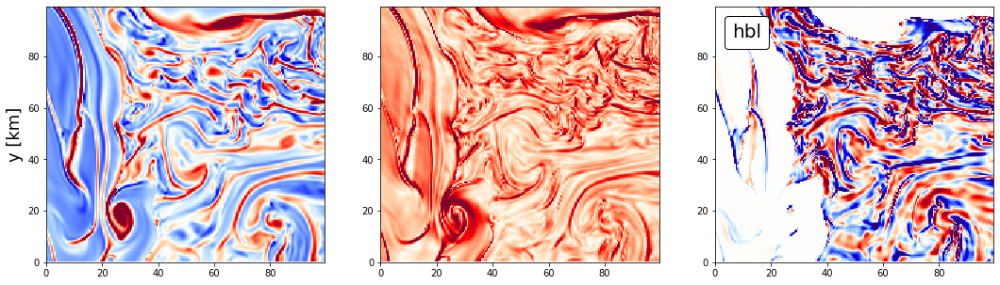

In [90]:
##################################################
# interpolate variables at BBL depth:


my_cmap=plot.ncview_colormap('blu_red')
levels = np.arange(-1.,1.01,0.01)*2.    
levelsw = np.arange(-1.,1.01,0.01)*0.2e-2   

###############################

fig = plt.figure(figsize=(18.0,5.0))

###############################

ax1 = plt.subplot(1,3,1);
CS1 = plt.pcolormesh(simul.x.T,simul.y.T,ma.masked_invalid(vrt_hbl[:,:,1].T),vmin=min(levels), vmax=max(levels),cmap=my_cmap,rasterized=True);
plt.ylabel(r'y [km]',fontsize=18) #plt.xlabel(r'${\rm km}$');

###############################
ax1 = plt.subplot(1,3,2);
CS1 = plt.pcolormesh(simul.x.T,simul.y.T,ma.masked_invalid(strain_hbl[:,:,1].T),vmin=min(levels), vmax=max(levels),cmap=my_cmap,rasterized=True);
#plt.ylabel(r'y [km]',fontsize=18) #plt.xlabel(r'${\rm km}$');

###############################
ax1 = plt.subplot(1,3,3);
CS1 = plt.pcolormesh(simul.x.T,simul.y.T,ma.masked_invalid(w_hbl[:,:,1].T),vmin=min(levelsw), vmax=max(levelsw),cmap=my_cmap,rasterized=True);
#plt.ylabel(r'y [km]',fontsize=18) #plt.xlabel(r'${\rm km}$');

# add label
at = AnchoredText('hbl',loc=2, prop=dict(size=20), frameon=True, )
at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2"); ax1.add_artist(at)

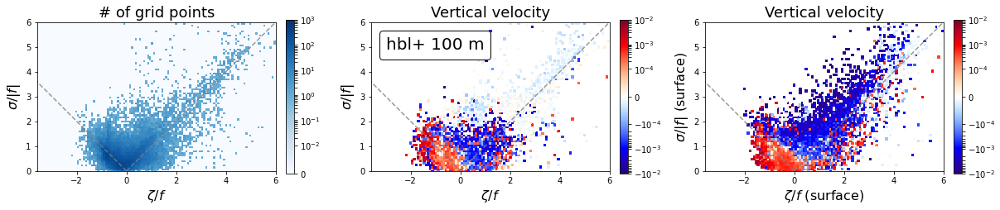

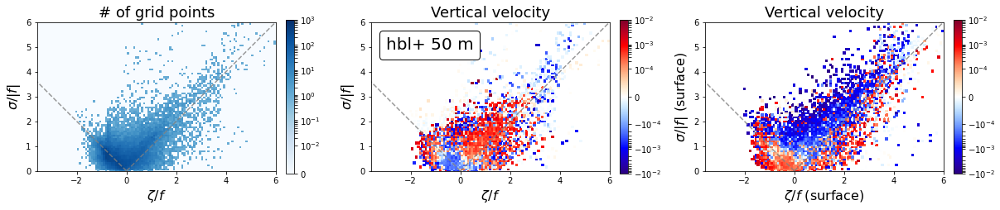

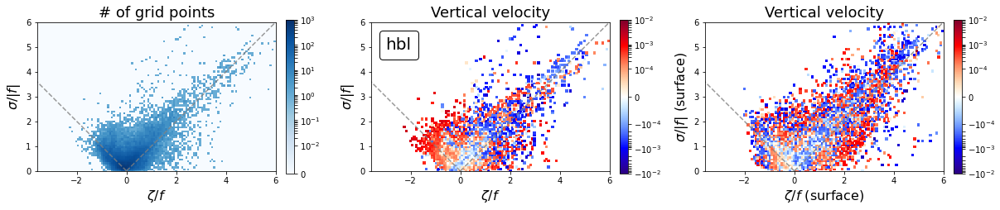

In [91]:


#jpdf(vrt[:,:,-1],strain[:,:,-1],w[:,:,-1],'surface',vrtsfc=vrt[:,:,-1],strainsfc=strain[:,:,-1])


jpdf(vrt_hbl[:,:,2],strain_hbl[:,:,2],w_hbl[:,:,2],'hbl+ 100 m',vrtsfc=vrt[:,:,-1],strainsfc=strain[:,:,-1])
jpdf(vrt_hbl[:,:,1],strain_hbl[:,:,1],w_hbl[:,:,1],'hbl+ 50 m',vrtsfc=vrt[:,:,-1],strainsfc=strain[:,:,-1])
jpdf(vrt_hbl[:,:,0],strain_hbl[:,:,0],w_hbl[:,:,0],'hbl',vrtsfc=vrt[:,:,-1],strainsfc=strain[:,:,-1])


    
    

/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:79: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:84: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.


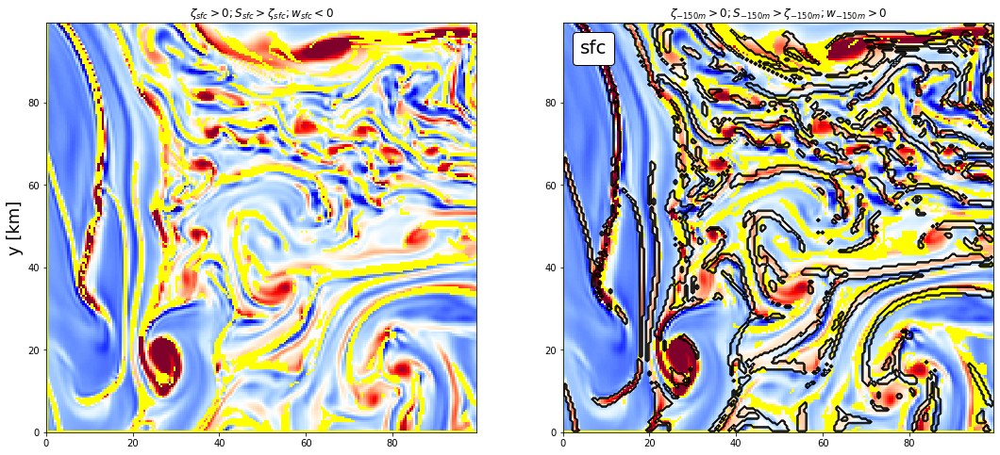

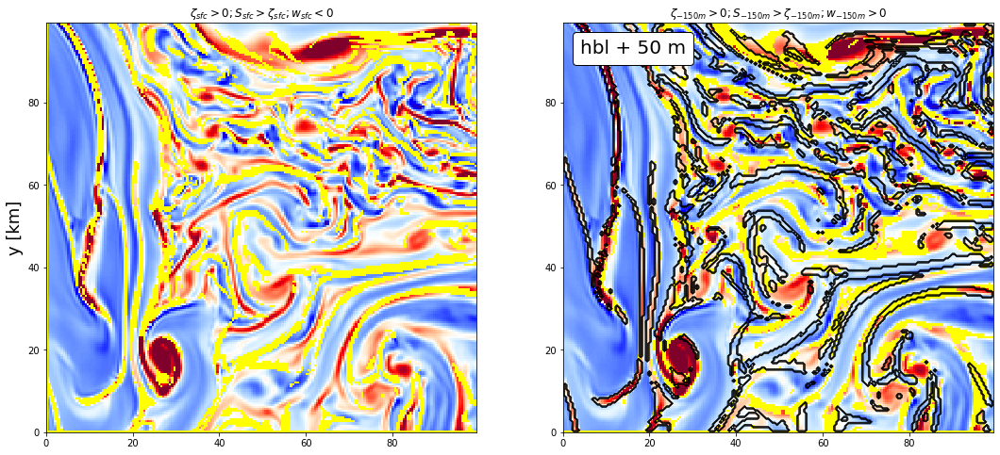

In [92]:
idepth0 = 1



vrtc1 = copy(vrt_hbl)
strainc1 = copy(strain_hbl)
wc1 = copy(w_hbl)
#divc1 = copy(div_hbl)

vrtc2 = copy(vrt_hbl)
strainc2 = copy(strain_hbl)
wc2 = copy(w_hbl)
#divc2 = copy(div_hbl)

##################################################

'''
cond1 = functools.reduce(np.logical_and, (hbls_rho>150,hbls_rho<200,\
                                         vrt[:,:,idepth0]>0,\
                                         strain[:,:,idepth0]>vrt[:,:,idepth0],\
                                         w[:,:,idepth0]>0.,\
                                         w[:,:,-2]<0.))

cond2 = functools.reduce(np.logical_and, (hbls_rho>150,hbls_rho<200,\
                                         vrt[:,:,idepth0]>0,\
                                         strain[:,:,idepth0]>vrt[:,:,idepth0],\
                                         w[:,:,idepth0]>0.,\
                                         w[:,:,-2]>0.))
'''

#cond = functools.reduce(np.logical_and, (vrt[:,:,idepth0]>0,strain[:,:,idepth0]>vrt[:,:,idepth0],w[:,:,idepth0]<0.))

# surface fronts
title_cond1 = r'$\zeta_{sfc}>0; S_{sfc}>\zeta_{sfc}; w_{sfc}<0$'
cond1 = functools.reduce(np.logical_and, (vrt[:,:,-1]>0,strain[:,:,-1]>vrt[:,:,-1],w[:,:,-1]<0.));

# surface fronts
title_cond2 = r'$\zeta_{-150 m}>0; S_{-150 m}>\zeta_{-150 m}; w_{-150 m}>0$'
cond2 = functools.reduce(np.logical_and, (\
                                         vrt_hbl[:,:,idepth0]>0,\
                                         strain_hbl[:,:,idepth0]>vrt_hbl[:,:,idepth0],\
                                         w_hbl[:,:,idepth0]>0.))
####

vrtc1[cond1] = np.nan
strainc1[cond1] = np.nan
wc1[cond1] = np.nan
#divc1[cond1] = np.nan

vrtc2[cond2] = np.nan
strainc2[cond2] = np.nan
wc2[cond2] = np.nan
#divc2[cond2] = np.nan

##################################################

my_cmap=plot.ncview_colormap('blu_red')
levels = np.arange(-1.,1.01,0.01)*2.    
levelsw = np.arange(-1.,1.01,0.01)*0.2e-2   

my_cmap.set_bad('yellow',1.)

###############################


label_depths[-1] = 'sfc'
label_depths[1] = 'hbl + 50 m'

for idepth in [-1,1]:
    
    
    fig = plt.figure(figsize=(18.0,8.0))
    
    

    ###############################

    ax1 = plt.subplot(1,2,1); plt.title(title_cond1)
    CS1 = plt.pcolormesh(simul.x.T,simul.y.T,ma.masked_invalid(vrtc1[:,:,idepth].T),vmin=min(levels), vmax=max(levels),cmap=my_cmap,rasterized=True);
    plt.ylabel(r'y [km]',fontsize=18) #plt.xlabel(r'${\rm km}$');

    ###############################
    ax1 = plt.subplot(1,2,2); plt.title(title_cond2)
    CS1 = plt.pcolormesh(simul.x.T,simul.y.T,ma.masked_invalid(vrtc2[:,:,idepth].T),vmin=min(levels), vmax=max(levels),cmap=my_cmap,rasterized=True);
    #plt.ylabel(r'y [km]',fontsize=18) #plt.xlabel(r'${\rm km}$');

    plt.contour(simul.x.T,simul.y.T,cond1.T,colors='k',linewidths=0.5)
    # add label
    at = AnchoredText(label_depths[idepth],loc=2, prop=dict(size=20), frameon=True, )
    at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2"); ax1.add_artist(at)



In [93]:
ix = 5

#ix1=latx-200+100; ix2=latx+200+100
#iy1=laty-200+100; iy2=laty+200+100

ix1=latx-100; ix2=latx+100
iy1=laty-100; iy2=laty+100

newlatx = latx #+ 100
latx_sec = newlatx - simul.coord[2]

simuly = load(simul = simulname + ' [' + format(np.max([0,iy1])) + ',' + format(iy2)\
                              +  ',' + format(newlatx-ix) + ',' + format(newlatx+ix)\
                              +  ',[1,300,1]] ' + format(time), output=False);

ix1,ix2=0,-1; iy1,iy2=0,-1


print(latx_sec + simul.coord[2])




file opened in oceandate
file closed in oceandate
1002


In [94]:
simuly.x = np.cumsum(1/simuly.pm,axis=0)/1000.
simuly.y = np.cumsum(1/simuly.pn,axis=1)/1000.
simuly.x -=  simuly.x[0,0]
simuly.y -=  simuly.y[0,0]

###################################################################################
#Compute vertical coordinates 
###################################################################################

[z_ry,z_wy] = tools.get_depths(simuly)

# define lon in 3d
lat3dy = np.tile(simuly.y.T,(z_ry.shape[2],1,1)).T
lat3dy_w = np.tile(simuly.y.T,(z_wy.shape[2],1,1)).T

#################################################

vrtzy = (var('vrt',simuly).data.T / tools.rho2psi(simuly.f).T ).T
divzy =var('div',simuly).data
wzy = var('w',simuly).data

# for plots
rhozy = var('rho1',simuly).data + simul.rho0 - 1000.
hbly = var('hbl',simuly).data
hbls_rhoy = var('hbls_rho',simuly).data

#################################################

strzy = (var('str',simuly).data.T / simuly.f.T ).T
vrtzy_rho = tools.psi2rho(vrtzy)

#frontal regions
cond1_zy = functools.reduce(np.logical_and, (vrtzy_rho<strzy,vrtzy_rho>0,wzy<0))
cond2_zy = functools.reduce(np.logical_and, (vrtzy_rho<strzy,vrtzy_rho>0,wzy>0))

#################################################

dxbuoy2 = var('dxbuoy2',simuly).data 
tendency  = var('tendency',simuly).data
AKv = var('AKv',simuly).data
kdzu = var('kdzu',simuly).data
#kdzu2 = var('kdzu2',simuly).data


corgrid [0, 0]
nchunk 1
in get_var depths is [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180
 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198
 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216
 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234
 235 2

In [95]:
def ploty(myvar,ax1,label=' ',cmap='blu_red',levels=np.linspace(0.,1.,100),grid='rhorho',scale='lin'):
    
    ###############################
    my_cmap=plot.ncview_colormap(cmap); 

    print(grid,scale,levels.min(),levels.max())
    
    if grid=='rhow':
        if scale=='log':
            CS1 = plt.pcolormesh(lat3dy_w[ix,iy1:iy2,:], z_wy[ix,iy1:iy2,:],
                             myvar[ix,iy1:iy2,:],\
                             norm=colors.SymLogNorm(linthresh=levels.min(),base=10,vmin=levels.min(),vmax=levels.max()),\
                             cmap = my_cmap, shading='auto'); 
            #CS1 = plt.pcolormesh(lat3dy_w[ix,iy1:iy2,:], z_wy[ix,iy1:iy2,:],
            #   AKv[ix,iy1:iy2,:], norm=colors.SymLogNorm(linthresh=1e-5,base=10,vmin=1e-5,vmax=1e0) ,cmap = my_cmap); #plt.colorbar()

        else:
            CS1 = plt.pcolormesh(lat3dy_w[ix,iy1:iy2,:], z_wy[ix,iy1:iy2,:],
                             myvar[ix,iy1:iy2,:],\
                             vmin=levels.min(), vmax=levels.max() ,cmap = my_cmap, shading='auto');
    elif grid=='rhorho':
        CS1 = plt.pcolormesh(lat3dy[ix,iy1:iy2,:], z_ry[ix,iy1:iy2,:],
                myvar[ix,iy1:iy2,:], vmin=levels.min(), vmax=levels.max() ,cmap = my_cmap, shading='auto');
    elif grid=='psirho':
        CS1 = plt.pcolormesh(tools.rho2psi(lat3dy)[ix,iy1:iy2,:], tools.rho2psi(z_ry)[ix,iy1:iy2,:],
                myvar[ix,iy1:iy2,:], vmin=levels.min(), vmax=levels.max() ,cmap = my_cmap, shading='auto');
        
    fig.colorbar(CS1, ax = ax1,fraction=0.03, pad=0.04)
    plt.ylabel(r'z [m]',fontsize=18); plt.ylim([-200, 0]); 

    # density
    sigs = np.concatenate((np.arange(24, 25.8, 0.005),np.arange(25.8, 27, 0.05)))
    CS2 = plt.contour(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],rhozy[ix,iy1:iy2,:],sigs,\
                      colors = ('k',), linewidths = (0.8,));
    plt.clabel(CS2, fmt = '%1.1f', colors = 'k', fontsize=6)  ;

    # HBL
    #plt.plot(lat3dy[ix,iy1:iy2,:],-hbly[ix,iy1:iy2],'-y', linewidth=2);
    plt.plot(lat3dy[ix,iy1:iy2,:],-hbls_rhoy[ix,iy1:iy2],'--y', linewidth=4);

    ###############################

    at = AnchoredText(label,loc=4, prop=dict(size=20), frameon=True, )
    at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2")
    ax1.add_artist(at)


/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:11: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  # This is added back by InteractiveShellApp.init_path()
/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:15: UserWarning: No contour levels were found within the data range.
  from ipykernel import kernelapp as app
/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:34: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher

rhorho lin -2.0 2.0000000000000036


/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:64: UserWarning: The following kwargs were not used by contour: 'linewidth'
/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:65: UserWarning: The following kwargs were not used by contour: 'linewidth'
/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.


rhorho lin -0.005 0.005000000000000009


/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:73: UserWarning: The following kwargs were not used by contour: 'linewidth'
/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:74: UserWarning: The following kwargs were not used by contour: 'linewidth'
/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.


rhorho lin -1.0 1.0


/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:82: UserWarning: The following kwargs were not used by contour: 'linewidth'
/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:83: UserWarning: The following kwargs were not used by contour: 'linewidth'
/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.


rhorho lin 0.0 1.9799999999999998e-14


/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:91: UserWarning: The following kwargs were not used by contour: 'linewidth'
/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:92: UserWarning: The following kwargs were not used by contour: 'linewidth'
/home/gula/.virtualenvs/croco36/lib/python3.6/site-packages/ipykernel_launcher.py:23: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.


rhorho lin -1e-18 1.0000000000000018e-18


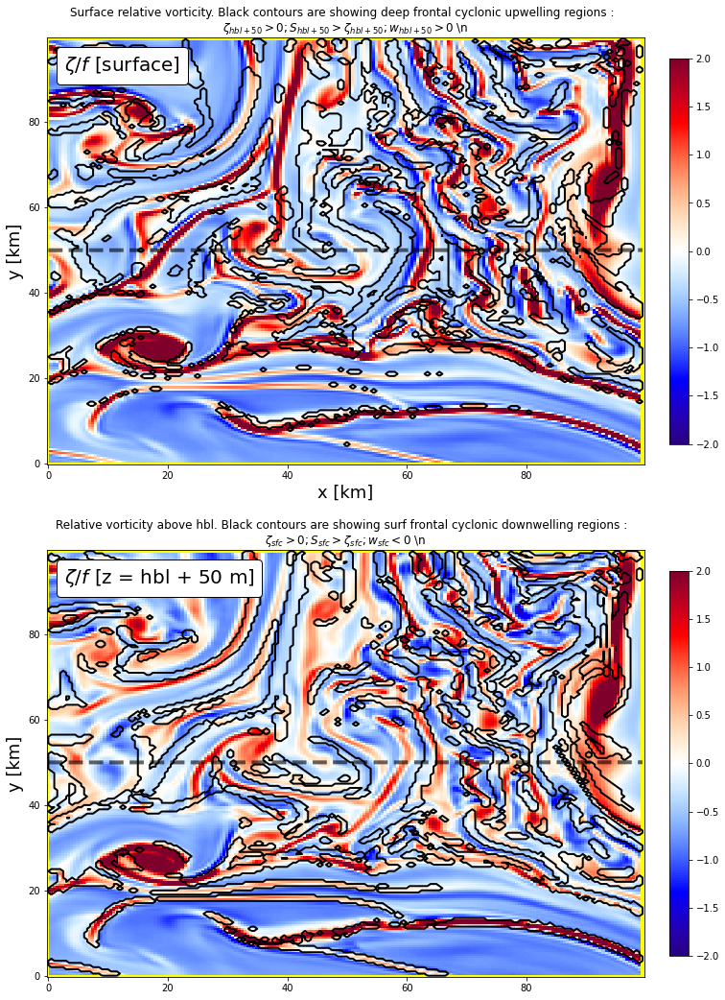

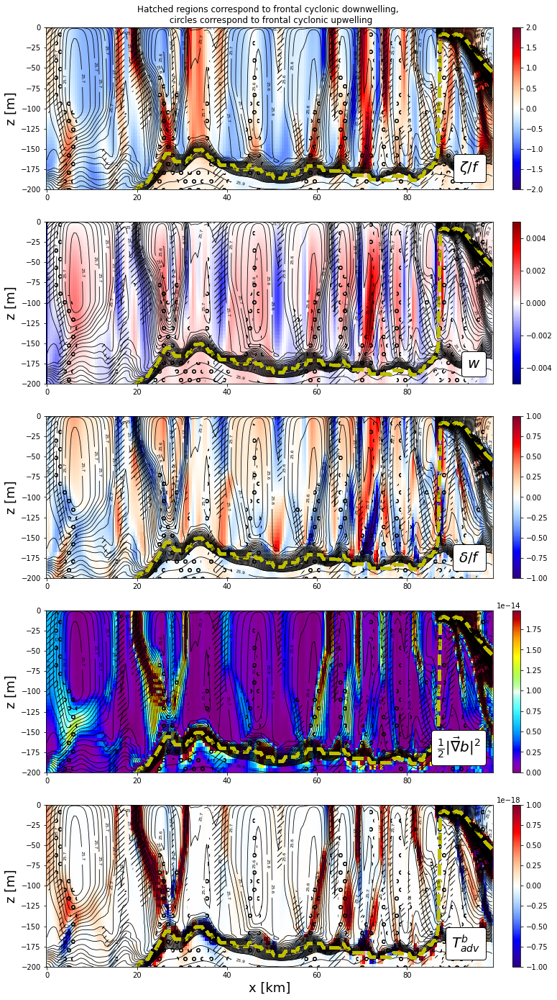

In [96]:
fig = plt.figure(figsize=(12.0,18.0))


ax1 = plt.subplot(2,1,1);


##############
plt.title('Surface relative vorticity. Black contours are showing deep frontal cyclonic upwelling regions :  \n'\
          + r'$\zeta_{hbl+50}>0; S_{hbl+50}>\zeta_{hbl+50}; w_{hbl+50}>0$ \n')
CS1 = plt.pcolormesh(simul.y,simul.x,ma.masked_invalid(vrt[:,:,-1]),vmin=min(levels),\
                     vmax=max(levels),cmap=my_cmap,rasterized=True,shading='auto');
#plt.ylabel(r'y [km]',fontsize=18) #plt.xlabel(r'${\rm km}$');
fig.colorbar(CS1, ax = ax1,fraction=0.03, pad=0.04)

plt.contour(simul.y,simul.x,cond2,[0,1],colors='k',linewidths=(2,))

plt.plot(simul.y[latx_sec,:],simul.x[latx_sec,:], 'k--', linewidth=4, alpha=0.6)

# add label
at = AnchoredText(r'$\zeta/f$ [surface]',loc=2, prop=dict(size=20), frameon=True, )
at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2"); ax1.add_artist(at)
#plt.ylim([10, 40])
plt.xlabel('x [km]',fontsize=18); plt.ylabel('y [km]',fontsize=18)
###############################


ax1 = plt.subplot(2,1,2);


##############
plt.title('Relative vorticity above hbl. Black contours are showing surf frontal cyclonic downwelling regions :  \n'\
          + r'$\zeta_{sfc}>0; S_{sfc}>\zeta_{sfc}; w_{sfc}<0$ \n')
CS1 = plt.pcolormesh(simul.y,simul.x,ma.masked_invalid(vrt_hbl[:,:,1]),vmin=min(levels),\
                     vmax=max(levels),cmap=my_cmap,rasterized=True,shading='auto');
#plt.ylabel(r'y [km]',fontsize=18) #plt.xlabel(r'${\rm km}$');
fig.colorbar(CS1, ax = ax1,fraction=0.03, pad=0.04)

plt.contour(simul.y,simul.x,cond1,[0,1],colors='k',linewidths=(2,))
plt.plot(simul.y[latx_sec,:],simul.x[latx_sec,:], 'k--', linewidth=4, alpha=0.6)

# add label
at = AnchoredText(r'$\zeta/f$ [z = hbl + 50 m]',loc=2, prop=dict(size=20), frameon=True, )
at.patch.set_boxstyle("round,pad=0.,rounding_size=0.2"); ax1.add_artist(at)
#plt.ylim([10, 40])
plt.ylabel('y [km]',fontsize=18)

###############################

plt.savefig('horizy_cond_front_nesev_' + format(latx_sec + simul.coord[2]) + '_' + format(time) + '.png',dpi=200,bbox_inches='tight')





fig = plt.figure(figsize=(12.0,24.0))

##################################################

ax1 = plt.subplot(5,1,1);


plt.title('Hatched regions correspond to frontal cyclonic downwelling, \n circles correspond to frontal cyclonic upwelling')
ploty(vrtzy_rho,ax1,label=r'$\zeta/f$',cmap='blu_red',levels=np.arange(-1.,1.01,0.01)*2. ,grid='rhorho',scale='lin')
plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond1_zy[ix,iy1:iy2,:],[0.5,10.], colors='none', linewidth=1, hatches=['///'], alpha=0.,extend='lower')
plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond2_zy[ix,iy1:iy2,:],[0.5,10.], colors='none', linewidth=1, hatches=['o'], alpha=0.,extend='lower')

##################################################

ax1 = plt.subplot(5,1,2);
ploty(wzy,ax1,label=r'$w$',cmap='blue_red',levels=np.arange(-1.,1.01,0.01)*0.005,grid='rhorho',scale='lin')
#ploty(strzy,ax1,label=r'$S$',cmap='blu_red',levels=np.arange(-1.,1.01,0.01)*2. ,grid='rhorho',scale='lin')
#plt.contour(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond[ix,iy1:iy2,:],colors = ('w',), linewidths = (0.5,));
plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond1_zy[ix,iy1:iy2,:],[0.5,10.], colors='none', linewidth=1, hatches=['///'], alpha=0.,extend='lower')
plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond2_zy[ix,iy1:iy2,:],[0.5,10.], colors='none', linewidth=1, hatches=['o'], alpha=0.,extend='lower')


##################################################

ax2 = plt.subplot(5,1,3);
ploty(divzy,ax2,label=r'$\delta/f$',cmap='blu_red',levels=np.linspace(-1.,1.,100)*1,grid='rhorho',scale='lin')
#plt.contour(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond[ix,iy1:iy2,:],colors = ('w',), linewidths = (0.5,));
plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond1_zy[ix,iy1:iy2,:],[0.5,10.], colors='none', linewidth=1, hatches=['///'], alpha=0.,extend='lower')
plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond2_zy[ix,iy1:iy2,:],[0.5,10.], colors='none', linewidth=1, hatches=['o'], alpha=0.,extend='lower')


##################################################


ax1 = plt.subplot(5,1,4);
ploty(dxbuoy2,ax1,label=r'$\frac{1}{2} \| \vec{\nabla} b \|^2 $',cmap='jaisnb',levels=np.arange(0,1,0.01)*0.2e-13,grid='rhorho',scale='lin')
plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond1_zy[ix,iy1:iy2,:],[0.5,10.], colors='none', linewidth=1, hatches=['///'], alpha=0.,extend='lower')
plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond2_zy[ix,iy1:iy2,:],[0.5,10.], colors='none', linewidth=1, hatches=['o'], alpha=0.,extend='lower')


###############################
ax2 = plt.subplot(5,1,5);
ploty(tendency,ax2,label=r'$T^b_{adv}$',cmap='blu_red',levels=np.arange(-1.,1.02,0.02)*1e-18,grid='rhorho',scale='lin')
plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond1_zy[ix,iy1:iy2,:],[0.5,10.], colors='none', hatches=['///'], alpha=0.,extend='lower')
plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond2_zy[ix,iy1:iy2,:],[0.5,10.], colors='none',  hatches=['o'], alpha=0.,extend='lower')
plt.xlabel('x [km]',fontsize=18)
##################################################


plt.savefig('verty_cond_front_nesev_' + format(latx_sec + simul.coord[2]) + '_' + format(time) + '.png',dpi=200,bbox_inches='tight')



file opened in cst
read Cs_r in ncfile.Cs_r
file closed in cst
corgrid [0, 0]
nchunk 1
in get_var depths is [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162
 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180
 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198
 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216
 217 218 219 220

TypeError: Incompatible X, Y inputs to pcolormesh; see help(pcolormesh)

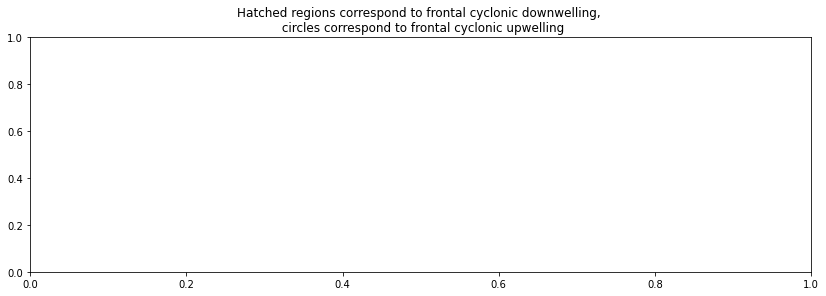

In [32]:
coef=1


for time1 in range(56,72):


    simuly.update(time1, output=False)


    ###################################################################################
    #Compute vertical coordinates 
    ###################################################################################

    [z_ry,z_wy] = tools.get_depths(simuly)

    # define lon in 3d
    lat3dy = np.tile(simul.y[latx_sec-5:latx_sec+5,:].T,(z_ry.shape[2],1,1)).T
    lat3dy_w = np.tile(simul.y[latx_sec-5:latx_sec+5,:].T,(z_wy.shape[2],1,1)).T

    #################################################

    vrtzy = (var('vrt',simuly).data.T / tools.rho2psi(simuly.f).T ).T
    divzy =var('div',simuly).data
    wzy = var('w',simuly).data

    # for plots
    rhozy = var('rho1',simuly).data + simul.rho0 - 1000.
    #hbly = var('hbl',simuly).data
    hbls_rhoy = var('hbls_rho',simuly).data

    #################################################

    strzy = (var('str',simuly).data.T / simuly.f.T ).T
    vrtzy_rho = tools.psi2rho(vrtzy)

    #frontal regions
    cond1_zy = functools.reduce(np.logical_and, (vrtzy_rho<strzy,vrtzy_rho>0,wzy<0))
    cond2_zy = functools.reduce(np.logical_and, (vrtzy_rho<strzy,vrtzy_rho>0,wzy>0))

    dxbuoy2 = var('dxbuoy2',simuly).data 
    tendency  = var('tendency',simuly).data

    ##############################



    fig = plt.figure(figsize=(14.0,25.0))


    levels = np.arange(-1.,1.01,0.01)*2. *coef
    xaxis = [0, 50]



    ##################################################

    ax1 = plt.subplot(5,1,1);

    plt.title('Hatched regions correspond to frontal cyclonic downwelling, \n circles correspond to frontal cyclonic upwelling')
    ploty(vrtzy_rho,ax1,label=r'$\zeta/f$',cmap='blu_red',levels=np.arange(-1.,1.01,0.01)*2.*coef ,grid='rhorho',scale='lin')
    plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond1_zy[ix,iy1:iy2,:],[0.5,10.], colors='none',  hatches=['///'], alpha=0.,extend='lower')
    plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond2_zy[ix,iy1:iy2,:],[0.5,10.], colors='none',  hatches=['o'], alpha=0.,extend='lower')
    plt.xlim(xaxis)

    ##################################################

    ax1 = plt.subplot(5,1,2);
    ploty(wzy,ax1,label=r'$w$',cmap='blue_red',levels=np.arange(-1.,1.01,0.01)*0.005*coef,grid='rhorho',scale='lin')
    #ploty(strzy,ax1,label=r'$S$',cmap='blu_red',levels=np.arange(-1.,1.01,0.01)*2. ,grid='rhorho',scale='lin')
    #plt.contour(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond[ix,iy1:iy2,:],colors = ('w',), linewidths = (0.5,));
    plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond1_zy[ix,iy1:iy2,:],[0.5,10.], colors='none', hatches=['///'], alpha=0.,extend='lower')
    plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond2_zy[ix,iy1:iy2,:],[0.5,10.], colors='none', hatches=['o'], alpha=0.,extend='lower')
    plt.xlim(xaxis)

    ##################################################

    ax2 = plt.subplot(5,1,3);
    ploty(divzy,ax2,label=r'$\delta/f$',cmap='blu_red',levels=np.linspace(-1.,1.,100)*1*coef*0.5,grid='rhorho',scale='lin')
    #plt.contour(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond[ix,iy1:iy2,:],colors = ('w',), linewidths = (0.5,));
    plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond1_zy[ix,iy1:iy2,:],[0.5,10.], colors='none',  hatches=['///'], alpha=0.,extend='lower')
    plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond2_zy[ix,iy1:iy2,:],[0.5,10.], colors='none',  hatches=['o'], alpha=0.,extend='lower')
    plt.xlim(xaxis)

    
    ax1 = plt.subplot(5,1,4);
    ploty(dxbuoy2,ax1,label=r'$\frac{1}{2} \| \vec{\nabla} b \|^2 $',cmap='jaisnb',levels=np.arange(0,1,0.01)*0.2e-13*coef,grid='rhorho',scale='lin')
    plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond1_zy[ix,iy1:iy2,:],[0.5,10.], colors='none', linewidth=1, hatches=['///'], alpha=0.,extend='lower')
    plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond2_zy[ix,iy1:iy2,:],[0.5,10.], colors='none', linewidth=1, hatches=['o'], alpha=0.,extend='lower')
    plt.xlim(xaxis)


    ###############################
    ax2 = plt.subplot(5,1,5);
    ploty(tendency,ax2,label=r'$T^b_{adv}$',cmap='blu_red',levels=np.arange(-1.,1.02,0.02)*1e-18*coef,grid='rhorho',scale='lin')
    plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond1_zy[ix,iy1:iy2,:],[0.5,10.], colors='none', hatches=['///'], alpha=0.,extend='lower')
    plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond2_zy[ix,iy1:iy2,:],[0.5,10.], colors='none',  hatches=['o'], alpha=0.,extend='lower')
    plt.xlim(xaxis); plt.xlabel('x [km]',fontsize=18)


    ##################################################

    plt.savefig('timeseries_cond_front_nesev_' + format(latx_sec + simul.coord[2]) + '_' + format(time1) + '.png',dpi=200,bbox_inches='tight')



In [ ]:

##################################################

fig = plt.figure(figsize=(12.0,18.0)); 


ax1 = plt.subplot(4,1,1);
ploty(dxbuoy2,ax1,label=r'$\frac{1}{2} \| \vec{\nabla} b \|^2 $',cmap='jaisnb',levels=np.arange(0,1,0.01)*0.2e-13,grid='rhorho',scale='lin')
plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond1_zy[ix,iy1:iy2,:],[0.5,10.], colors='none', linewidth=1, hatches=['///'], alpha=0.,extend='lower')
plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond2_zy[ix,iy1:iy2,:],[0.5,10.], colors='none', linewidth=1, hatches=['o'], alpha=0.,extend='lower')



###############################
ax2 = plt.subplot(4,1,2);
ploty(tendency,ax2,label=r'$T^b_{adv}$',cmap='blu_red',levels=np.arange(-1.,1.02,0.02)*1e-18,grid='rhorho',scale='lin')
plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond1_zy[ix,iy1:iy2,:],[0.5,10.], colors='none', hatches=['///'], alpha=0.,extend='lower')
plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond2_zy[ix,iy1:iy2,:],[0.5,10.], colors='none',  hatches=['o'], alpha=0.,extend='lower')

##################################################


ax1 = plt.subplot(4,1,3);
ploty(AKv,ax1,label=r'$K$',cmap='jaisnb',levels=np.linspace(1e-5,1e0,100),grid='rhow',scale='log')
plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond1_zy[ix,iy1:iy2,:],[0.5,10.], colors='none',  hatches=['///'], alpha=0.,extend='lower')
plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond2_zy[ix,iy1:iy2,:],[0.5,10.], colors='none',  hatches=['o'], alpha=0.,extend='lower')



###############################
ax2 = plt.subplot(4,1,4);
ploty(kdzu,ax2,label=r'$K \frac{\partial u}{\partial z}$',cmap='blu_red',levels=np.linspace(-1.,1.,100)*1e-4,grid='rhow',scale='lin')
plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond1_zy[ix,iy1:iy2,:],[0.5,10.], colors='none',  hatches=['///'], alpha=0.,extend='lower')
plt.contourf(lat3dy[ix,iy1:iy2,:],z_ry[ix,iy1:iy2,:],cond2_zy[ix,iy1:iy2,:],[0.5,10.], colors='none',  hatches=['o'], alpha=0.,extend='lower')
plt.xlabel('x [km]',fontsize=18)

###############################

plt.savefig('cond_front_nesev_' + format(latx_sec + simul.coord[2]) + '_suite.png',dpi=200,bbox_inches='tight')

